<a href="https://colab.research.google.com/github/Murcha1990/ML_AI24/blob/main/Hometasks/Base/AI_HW1_Regression_with_inference_base.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашнее задание №1 (base)**

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;
* реализовать веб-сервис для применения построенной модели на новых данных

**Максимальная оценка за дз**
> Оценка за домашку = $min(\text{ваш балл}, 11)$

**Мягкий дедлайн: 1 декабря 23:59 [уточняется]**

**Жесткий дедлайн: 20 декабря 23:59 (конец модуля)**


**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
import warnings

In [2]:
warnings.filterwarnings('ignore')

In [3]:
random.seed(42)

**Задание 0 (0 баллов).**
Для чего фиксируем сиды в домашках?

`Your answer here`
Чтобы в разных ноутбуках были одинаковые данные при разделении

# **Часть 1 | EDA и визуализация**

Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (2.5 балла)
- Визуализации признаков и их анализ (1 балл)

Всего можно набрать 3.5 основных балла и 0.65 бонусных. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (2.5 балла)**

In [4]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1 (0.55 балла)**

Выполните операции, направленные на практику основных действий с `pandas`:
- [ ] Отобразите 10 случайных строк тренировочного датасета (0.15 балла)
- [ ] Отобразите первые 5 и последние 5 объектов тестового датасета (0.1 балла)
- [ ] Посмотрите, есть ли в датасете пропуски. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)


**Бонус**
- [ ] Постройте дашборд, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)

In [5]:
# your code here
df_train.sample(n=10)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
5328,Renault Duster 110PS Diesel RxL Explore,2016,650000,30000,Diesel,Individual,Manual,First Owner,19.64 kmpl,1461 CC,108.45 bhp,245Nm@ 1750rpm,5.0
1595,Audi Q5 35TDI Premium Plus,2018,3975000,31800,Diesel,Dealer,Automatic,First Owner,17.01 kmpl,1968 CC,188 bhp,400nm@ 1750-3000rpm,5.0
6186,Maruti Wagon R LXI BS IV,2013,240000,108916,Petrol,Individual,Manual,Second Owner,20.51 kmpl,998 CC,67.04 bhp,90Nm@ 3500rpm,5.0
6162,Tata Hexa XM,2017,1251000,35000,Diesel,Individual,Manual,First Owner,17.6 kmpl,2179 CC,153.86 bhp,400Nm@ 1750-2500rpm,7.0
420,Ford Fiesta Titanium 1.5 TDCi,2013,300000,60000,Diesel,Individual,Manual,Second Owner,23.5 kmpl,1498 CC,90 bhp,204Nm@ 2000-2750rpm,5.0
4718,Maruti Swift ZXI BSIV,2018,730000,4773,Petrol,Dealer,Manual,First Owner,22.0 kmpl,1197 CC,81.80 bhp,113Nm@ 4200rpm,5.0
1778,Hyundai i20 Sportz 1.4 CRDi,2014,450000,56000,Diesel,Individual,Manual,First Owner,21.9 kmpl,1396 CC,88.76 bhp,219.6Nm@ 1750-2750rpm,5.0
3597,MG Hector Smart DCT,2019,1700000,16500,Petrol,Dealer,Automatic,First Owner,13.96 kmpl,1451 CC,141 bhp,250Nm@ 1600-3600rpm,5.0
3976,Hyundai Santro Sportz BSIV,2019,509999,5000,Petrol,Individual,Manual,First Owner,20.3 kmpl,1086 CC,68 bhp,99Nm@ 4500rpm,5.0
1183,Honda City i-VTEC S,2010,350000,58544,Petrol,Dealer,Manual,Second Owner,17.4 kmpl,1497 CC,117.3 bhp,145Nm@ 4600rpm,5.0


In [6]:
df_test.head(5)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0 kmpl,2498 CC,112 bhp,260 Nm at 1800-2200 rpm,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5 kmpl,1497 CC,108.5 bhp,260Nm@ 1500-2750rpm,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9 kmpl,1799 CC,130 bhp,172Nm@ 4300rpm,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5 kmpl,1172 CC,65 bhp,96 Nm at 3000 rpm,5.0


In [7]:
df_test.tail(5)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81 kmpl,1086 CC,68.05 bhp,99.04Nm@ 4500rpm,5.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36 kmpl,1197 CC,78.9 bhp,111.8Nm@ 4000rpm,5.0
999,Honda City i DTec SV,2016,700000,110000,Diesel,Individual,Manual,First Owner,26.0 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0


In [8]:
# процент пропусков от всей выборки, колонки с пропусками
def missing_values(data):
    missing_values = ((data.isna().sum() / len(data)) * 100).sort_values(ascending=False)
    missing_columns = missing_values[missing_values.values > 0].index.tolist()
    return print(f'Процент пропущенных значений:\n{missing_values},\n\nКолонки с пропусками:{missing_columns}')

In [9]:
missing_values(df_train)

Процент пропущенных значений:
torque           2.900414
mileage          2.886127
engine           2.886127
seats            2.886127
max_power        2.800400
name             0.000000
year             0.000000
selling_price    0.000000
km_driven        0.000000
fuel             0.000000
seller_type      0.000000
transmission     0.000000
owner            0.000000
dtype: float64,

Колонки с пропусками:['torque', 'mileage', 'engine', 'seats', 'max_power']


In [10]:
missing_values(df_test)

Процент пропущенных значений:
mileage          1.9
engine           1.9
max_power        1.9
torque           1.9
seats            1.9
name             0.0
year             0.0
selling_price    0.0
km_driven        0.0
fuel             0.0
seller_type      0.0
transmission     0.0
owner            0.0
dtype: float64,

Колонки с пропусками:['mileage', 'engine', 'max_power', 'torque', 'seats']


In [11]:
df_train[df_train.duplicated()]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
254,Hyundai Grand i10 Sportz,2017,450000,35000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,82 bhp,114Nm@ 4000rpm,5.0
258,Maruti Swift VXI,2012,330000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.0
324,Jaguar XE 2016-2019 2.0L Diesel Prestige,2017,2625000,9000,Diesel,Dealer,Automatic,First Owner,13.6 kmpl,1999 CC,177 bhp,430Nm@ 1750-2500rpm,5.0
325,Lexus ES 300h,2019,5150000,20000,Petrol,Dealer,Automatic,First Owner,22.37 kmpl,2487 CC,214.56 bhp,202Nm@ 3600-5200rpm,5.0
326,Jaguar XF 2.0 Diesel Portfolio,2017,3200000,45000,Diesel,Dealer,Automatic,First Owner,19.33 kmpl,1999 CC,177 bhp,430Nm@ 1750-2500rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6880,Renault Captur 1.5 Diesel RXT,2018,1265000,12000,Diesel,Individual,Manual,First Owner,20.37 kmpl,1461 CC,108.45 bhp,240Nm@ 1750rpm,5.0
6881,Maruti Ciaz Alpha Diesel,2019,1025000,32000,Diesel,Individual,Manual,First Owner,28.09 kmpl,1248 CC,88.50 bhp,200Nm@ 1750rpm,5.0
6989,Maruti Swift Dzire VDI,2015,625000,50000,Diesel,Individual,Manual,First Owner,26.59 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0


In [12]:
df_test[df_test.duplicated()]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
200,Maruti Swift AMT VVT VXI,2019,650000,5621,Petrol,Trustmark Dealer,Automatic,First Owner,22.0 kmpl,1197 CC,81.80 bhp,113Nm@ 4200rpm,5.0
235,Hyundai Grand i10 1.2 CRDi Sportz,2017,450000,56290,Diesel,Dealer,Manual,First Owner,24.0 kmpl,1186 CC,73.97 bhp,190.24nm@ 1750-2250rpm,5.0
238,Toyota Camry 2.5 Hybrid,2016,2000000,68089,Petrol,Trustmark Dealer,Automatic,First Owner,19.16 kmpl,2494 CC,157.7 bhp,213Nm@ 4500rpm,5.0
253,Tata Safari Storme EX,2015,503000,110000,Diesel,Individual,Manual,First Owner,14.1 kmpl,2179 CC,147.94 bhp,320Nm@ 1500-3000rpm,7.0
269,Jaguar XF 2.0 Diesel Portfolio,2017,3200000,45000,Diesel,Dealer,Automatic,First Owner,19.33 kmpl,1999 CC,177 bhp,430Nm@ 1750-2500rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
934,Mercedes-Benz S-Class S 350 CDI,2017,6000000,37000,Diesel,Dealer,Automatic,First Owner,13.5 kmpl,2987 CC,254.79 bhp,620Nm@ 1600-2400rpm,5.0
936,BMW X4 M Sport X xDrive20d,2019,5500000,8500,Diesel,Dealer,Automatic,First Owner,16.78 kmpl,1995 CC,190 bhp,400Nm@ 1750-2500rpm,5.0
949,Toyota Camry 2.5 Hybrid,2016,2000000,68089,Petrol,Trustmark Dealer,Automatic,First Owner,19.16 kmpl,2494 CC,157.7 bhp,213Nm@ 4500rpm,5.0
971,Maruti Ertiga SHVS ZDI Plus,2017,750000,50000,Diesel,Individual,Manual,First Owner,24.52 kmpl,1248 CC,88.5 bhp,200Nm@ 1750rpm,7.0


Вывод: есть дубликаты в train и test

In [13]:
from ydata_profiling import ProfileReport

In [14]:
profile_train = ProfileReport(df_train, title="Отчет по данным train", explorative=True)
profile_train.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [15]:
profile_test = ProfileReport(df_test, title="Отчет по данным train", explorative=True)
profile_test.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Мы обнаружили пропуски. Давайте избавимся от них.

- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось. Заполнение пропусков проводите для обоих наборов данных, если необходимо

**Важно!**

При заполнении пропусков и в тестовом, и тренировочном наборах данных вы определяетесь со стратегией предобработки пропущенных значений при потенциальной работе модели.

Так как в теоретическом случае вы не имеете доступа к тестовой выборке, то заполняемой значение (у нас — медиана) вы считаете про *тренировочному* набору данных и им же заполняете *тестовый*.

In [16]:
# your code here

Сперва обработаем колонки с пропусками, т.к. они не все числовые

In [17]:
import re

In [18]:
def extract_numeric(str_num):
    if pd.isna(str_num) or str_num == 'NaN':
        return pd.Series([np.nan, np.nan])

    # Извлекаем момент и обороты
    parts = re.split('at|@', str_num)
    
    if len(parts) != 2:
        return pd.Series([np.nan, np.nan])

    Nm_part = parts[0].strip()
    rpm_part = parts[1].strip()
    
    # Обработка момента
    if 'kgm' in Nm_part.lower():
        if 'Nm' in (Nm_part.split('kgm')[0]):
            Nm_value = float(re.split('kgm|Nm|NM', Nm_part)[0])
        else:
            Nm_value = float(re.split('kgm|KGM', Nm_part)[0]) * 9.8
    else:
        Nm_value = float(re.split('Nm|nm|NM', Nm_part.replace('(', 'Nm'))[0].replace(',', ''))  # "4,500" -> "4500"

    # Обработка оборотов
    if '-' or '~' in rpm_part:  # интервал
        rpm_values = re.split('-|~', rpm_part)
        if len(rpm_values) == 2:
            rpm_value = (float(rpm_values[0].replace('rpm', '').replace('RPM', '').replace('+/', '').replace(',', '').strip()) + float(rpm_values[1].replace('rpm', '').replace('RPM', '').replace('+/', '').replace(',', '').strip())) / 2
        else:
            rpm_value = float(rpm_part.replace('rpm', '').replace('RPM', '').strip().replace(',', ''))
    else:
        rpm_value = float(rpm_part.replace('rpm', '').strip().replace(',', ''))

    return pd.Series([Nm_value, rpm_value])

In [19]:
df_train[['torque_Nm', 'torque_rpm']] = df_train['torque'].apply(extract_numeric)

In [20]:
df_train[['torque_Nm', 'torque_rpm']].head()

,torque_Nm,torque_rpm
0,190.00,2000.0
1,250.00,2000.0
2,219.52,2250.0
3,NaN,NaN
4,113.75,4000.0


In [21]:
df_test[['torque_Nm', 'torque_rpm']] = df_test['torque'].apply(extract_numeric)

In [22]:
df_test[['torque_Nm', 'torque_rpm']].head()

,torque_Nm,torque_rpm
0,260.0,2000.0
1,260.0,2125.0
2,172.0,4300.0
3,200.0,1750.0
4,96.0,3000.0


In [23]:
df_train['mileage_kmpl'] = df_train['mileage'].apply(lambda x: float(str(x).split(' ')[0]))

In [24]:
df_train['mileage_kmpl'].head()

0    23.40
1    21.14
2    23.00
3    16.10
4    20.14
Name: mileage_kmpl, dtype: float64

In [25]:
df_test['mileage_kmpl'] = df_test['mileage'].apply(lambda x: float(str(x).split(' ')[0]))

In [26]:
df_train['engine_CC'] = df_train['engine'].apply(lambda x: float(str(x).split(' ')[0]))

In [27]:
df_train['engine_CC'].head()

0    1248.0
1    1498.0
2    1396.0
3    1298.0
4    1197.0
Name: engine_CC, dtype: float64

In [28]:
df_test['engine_CC'] = df_test['engine'].apply(lambda x: float(str(x).split(' ')[0]))

In [29]:
def extract_float(value):
    try:
        return float(str(value).split()[0])
    except (ValueError, IndexError):
        return float('nan')

In [30]:
df_train['max_power_bhp'] = df_train['max_power'].apply(extract_float)

In [31]:
df_train['max_power_bhp'].head()

0     74.00
1    103.52
2     90.00
3     88.20
4     81.86
Name: max_power_bhp, dtype: float64

In [32]:
df_test['max_power_bhp'] = df_test['max_power'].apply(extract_float)

In [33]:
from sklearn.impute import SimpleImputer

In [34]:
imp_median = SimpleImputer(strategy='median')

med_cols = ['torque_Nm', 'torque_rpm', 'mileage_kmpl', 'engine_CC', 'seats', 'max_power_bhp']

df_train[med_cols] = imp_median.fit_transform(df_train[med_cols])
df_train.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,torque_Nm,torque_rpm,mileage_kmpl,engine_CC,max_power_bhp
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0,190.00,2000.0,23.40,1248.0,74.00
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0,250.00,2000.0,21.14,1498.0,103.52
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0,219.52,2250.0,23.00,1396.0,90.00
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0,170.00,2400.0,16.10,1298.0,88.20
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0,113.75,4000.0,20.14,1197.0,81.86


In [35]:
df_test[med_cols] = imp_median.transform(df_test[med_cols])

Удалим старые столбцы

In [36]:
df_train.drop(['torque', 'mileage', 'engine', 'max_power'], axis= 1, inplace= True)

In [37]:
df_test.drop(['torque', 'mileage', 'engine', 'max_power'], axis= 1, inplace= True)

Проверка:

In [38]:
missing_values(df_train)

Процент пропущенных значений:
name             0.0
year             0.0
selling_price    0.0
km_driven        0.0
fuel             0.0
seller_type      0.0
transmission     0.0
owner            0.0
seats            0.0
torque_Nm        0.0
torque_rpm       0.0
mileage_kmpl     0.0
engine_CC        0.0
max_power_bhp    0.0
dtype: float64,

Колонки с пропусками:[]


In [39]:
missing_values(df_test)

Процент пропущенных значений:
name             0.0
year             0.0
selling_price    0.0
km_driven        0.0
fuel             0.0
seller_type      0.0
transmission     0.0
owner            0.0
seats            0.0
torque_Nm        0.0
torque_rpm       0.0
mileage_kmpl     0.0
engine_CC        0.0
max_power_bhp    0.0
dtype: float64,

Колонки с пропусками:[]


### **Задание 2 (0.5 балла)**

На прошлом шаге вы убедились, что явных дубликатов в таблице нет. Однако дубликат может быть связан с не только полным повторением информации в нескольких строках, но и частиным. Например, объект мог был внесен в базу данных с разным значением целевой переменной. В этом шаге займемся такими дублями!

**Ваши действия:**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.1 балла)
- [ ] Отобразите такие объекты (0.15 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.15 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.1 балла)


In [40]:
# your code here

In [41]:
target = 'selling_price'	

In [42]:
features = df_train.drop(columns=[target])
duplicate_count = features.duplicated().sum()
print(f"Количество объектов с одинаковым признаковым описанием: {duplicate_count}")

Количество объектов с одинаковым признаковым описанием: 1159


In [43]:
duplicates = features[features.duplicated()]
duplicates

,name,year,km_driven,fuel,seller_type,transmission,owner,seats,torque_Nm,torque_rpm,mileage_kmpl,engine_CC,max_power_bhp
254,Hyundai Grand i10 Sportz,2017,35000,Petrol,Individual,Manual,First Owner,5.0,114.0,4000.0,18.90,1197.0,82.00
258,Maruti Swift VXI,2012,50000,Petrol,Individual,Manual,Second Owner,5.0,114.0,4000.0,18.60,1197.0,85.80
268,Maruti Swift Dzire VXI,2014,70000,Petrol,Individual,Manual,Second Owner,5.0,114.0,4000.0,19.10,1197.0,85.80
324,Jaguar XE 2016-2019 2.0L Diesel Prestige,2017,9000,Diesel,Dealer,Automatic,First Owner,5.0,430.0,2125.0,13.60,1999.0,177.00
325,Lexus ES 300h,2019,20000,Petrol,Dealer,Automatic,First Owner,5.0,202.0,4400.0,22.37,2487.0,214.56
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6947,Chevrolet Spark 1.0 LS,2010,60000,Petrol,Individual,Manual,Second Owner,5.0,90.3,4200.0,18.00,995.0,62.00
6984,Ford Freestyle Titanium Plus Diesel BSIV,2018,24000,Diesel,Individual,Manual,First Owner,5.0,215.0,2375.0,24.40,1498.0,98.63
6989,Maruti Swift Dzire VDI,2015,50000,Diesel,Individual,Manual,First Owner,5.0,190.0,2000.0,26.59,1248.0,74.00
6997,Tata Indigo CR4,2013,25000,Diesel,Individual,Manual,First Owner,5.0,140.0,2400.0,23.57,1396.0,70.00


In [44]:
df_train_clean = df_train.drop_duplicates(subset=features.columns.tolist(), keep='first')

In [45]:
df_train_clean.reset_index(drop=True, inplace=True)

In [46]:
df_train_clean.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,seats,torque_Nm,torque_rpm,mileage_kmpl,engine_CC,max_power_bhp
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,5.0,190.00,2000.0,23.40,1248.0,74.00
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,5.0,250.00,2000.0,21.14,1498.0,103.52
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,5.0,219.52,2250.0,23.00,1396.0,90.00
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,5.0,170.00,2400.0,16.10,1298.0,88.20
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,5.0,113.75,4000.0,20.14,1197.0,81.86


In [47]:
df_train_clean.shape

(5840, 14)

In [ ]:
assert df_train.shape == (5840, 13)

Не совпадает, т.к. я разделил столбец torque на torque_Nm и torque_rpm

Отлично! Мы избавились от маленьких и явных проблем. Теперь перейдем к более сложным недостаткам полученной таблицы.

### **Задание 3 (0.25 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Удалите столбец ``torque``


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.
- Стобец ``torque`` мы удаляем для простоты. В идеальном случае, его также стоило бы предобработать.

In [49]:
# your code here

Все действия проделаны в 1 задании, чтобы заполнить поропуски медианным значением. Столбцы mileage, engine, max_power изменены в mileage_kmpl, engine_CC, max_power_bhp соответсвенно. Столбец torque в 2 столбца torque_Nm	torque_rpm

In [50]:
df_train_clean.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,seats,torque_Nm,torque_rpm,mileage_kmpl,engine_CC,max_power_bhp
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,5.0,190.00,2000.0,23.40,1248.0,74.00
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,5.0,250.00,2000.0,21.14,1498.0,103.52
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,5.0,219.52,2250.0,23.00,1396.0,90.00
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,5.0,170.00,2400.0,16.10,1298.0,88.20
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,5.0,113.75,4000.0,20.14,1197.0,81.86


In [51]:
df_test.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,seats,torque_Nm,torque_rpm,mileage_kmpl,engine_CC,max_power_bhp
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,7.0,260.0,2000.0,14.0,2498.0,112.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,5.0,260.0,2125.0,21.5,1497.0,108.5
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,5.0,172.0,4300.0,12.9,1799.0,130.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,5.0,200.0,1750.0,25.1,1498.0,98.6
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,5.0,96.0,3000.0,16.5,1172.0,65.0


### **Задание 4 (0.1 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.

In [52]:
# your code here

In [53]:
df_train_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5840 entries, 0 to 5839
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           5840 non-null   object 
 1   year           5840 non-null   int64  
 2   selling_price  5840 non-null   int64  
 3   km_driven      5840 non-null   int64  
 4   fuel           5840 non-null   object 
 5   seller_type    5840 non-null   object 
 6   transmission   5840 non-null   object 
 7   owner          5840 non-null   object 
 8   seats          5840 non-null   float64
 9   torque_Nm      5840 non-null   float64
 10  torque_rpm     5840 non-null   float64
 11  mileage_kmpl   5840 non-null   float64
 12  engine_CC      5840 non-null   float64
 13  max_power_bhp  5840 non-null   float64
dtypes: float64(6), int64(3), object(5)
memory usage: 638.9+ KB


In [54]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           1000 non-null   object 
 1   year           1000 non-null   int64  
 2   selling_price  1000 non-null   int64  
 3   km_driven      1000 non-null   int64  
 4   fuel           1000 non-null   object 
 5   seller_type    1000 non-null   object 
 6   transmission   1000 non-null   object 
 7   owner          1000 non-null   object 
 8   seats          1000 non-null   float64
 9   torque_Nm      1000 non-null   float64
 10  torque_rpm     1000 non-null   float64
 11  mileage_kmpl   1000 non-null   float64
 12  engine_CC      1000 non-null   float64
 13  max_power_bhp  1000 non-null   float64
dtypes: float64(6), int64(3), object(5)
memory usage: 109.5+ KB


In [55]:
df_train_clean['engine_CC'] = df_train_clean['engine_CC'].astype(int)
df_train_clean['seats'] = df_train_clean['seats'].astype(int)

In [56]:
df_test['engine_CC'] = df_test['engine_CC'].astype(int)
df_test['seats'] = df_test['seats'].astype(int)

In [57]:
df_train_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5840 entries, 0 to 5839
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           5840 non-null   object 
 1   year           5840 non-null   int64  
 2   selling_price  5840 non-null   int64  
 3   km_driven      5840 non-null   int64  
 4   fuel           5840 non-null   object 
 5   seller_type    5840 non-null   object 
 6   transmission   5840 non-null   object 
 7   owner          5840 non-null   object 
 8   seats          5840 non-null   int32  
 9   torque_Nm      5840 non-null   float64
 10  torque_rpm     5840 non-null   float64
 11  mileage_kmpl   5840 non-null   float64
 12  engine_CC      5840 non-null   int32  
 13  max_power_bhp  5840 non-null   float64
dtypes: float64(4), int32(2), int64(3), object(5)
memory usage: 593.3+ KB


In [58]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           1000 non-null   object 
 1   year           1000 non-null   int64  
 2   selling_price  1000 non-null   int64  
 3   km_driven      1000 non-null   int64  
 4   fuel           1000 non-null   object 
 5   seller_type    1000 non-null   object 
 6   transmission   1000 non-null   object 
 7   owner          1000 non-null   object 
 8   seats          1000 non-null   int32  
 9   torque_Nm      1000 non-null   float64
 10  torque_rpm     1000 non-null   float64
 11  mileage_kmpl   1000 non-null   float64
 12  engine_CC      1000 non-null   int32  
 13  max_power_bhp  1000 non-null   float64
dtypes: float64(4), int32(2), int64(3), object(5)
memory usage: 101.7+ KB


### **Задание 5 (0.1 балла)**

Отлично! Мы провели "косметическую" предобработку и теперь готовы сделать важный шаг в контексте анализа данных. А именно — посмотреть на статистики!

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

**Примечание:**

Более корректно рассматривать статистики до заполнения пропусков и после, чтобы убедиться, что мы не внесли каких-либо серьезных сдвигов в изначальные рапсределения.

In [59]:
# your code here

Основные статистики по числовым столбцам для трейна и теста

In [60]:
df_train_clean.describe()

,year,selling_price,km_driven,seats,torque_Nm,torque_rpm,mileage_kmpl,engine_CC,max_power_bhp
count,5840.000000,5.840000e+03,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,5.229601e+05,7.395224e+04,5.426712,172.010765,2825.619092,19.428611,1429.448973,87.910782
std,4.095622,5.354320e+05,6.007114e+04,0.982344,82.481323,929.791579,3.986026,485.662834,31.639585
min,1983.000000,2.999900e+04,1.000000e+00,2.000000,47.040000,1300.000000,0.000000,624.000000,0.000000
25%,2011.000000,2.500000e+05,3.900000e+04,5.000000,112.000000,2000.000000,16.950000,1197.000000,68.000000
50%,2014.000000,4.050000e+05,7.000000e+04,5.000000,170.000000,2400.000000,19.300000,1248.000000,81.860000
75%,2017.000000,6.400000e+05,1.000000e+05,5.000000,200.000000,3550.000000,22.300000,1498.000000,99.000000
max,2020.000000,1.000000e+07,2.360457e+06,14.000000,789.000000,5000.000000,42.000000,3604.000000,400.000000


In [61]:
df_test.describe()

,year,selling_price,km_driven,seats,torque_Nm,torque_rpm,mileage_kmpl,engine_CC,max_power_bhp
count,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000
mean,2013.681000,6.179010e+05,71393.341000,5.403000,174.45693,2871.351000,19.337480,1454.87600,90.844330
std,4.012149,7.585539e+05,48486.218662,0.912921,86.45729,947.423071,3.951751,521.99574,34.892709
min,1995.000000,3.100000e+04,1303.000000,4.000000,48.00000,1470.000000,0.000000,624.00000,34.200000
25%,2011.000000,2.500000e+05,37000.000000,5.000000,111.72000,2125.000000,16.550000,1197.00000,69.000000
50%,2014.000000,4.349990e+05,61500.000000,5.000000,170.00000,2400.000000,19.300000,1248.00000,82.425000
75%,2017.000000,6.700000e+05,100000.000000,5.000000,204.25000,4000.000000,22.300000,1582.00000,102.000000
max,2020.000000,6.000000e+06,375000.000000,9.000000,620.00000,5000.000000,32.260000,3604.00000,280.000000


Основные статистики по категориальным столбцам для трейна и теста

In [62]:
df_train_clean.describe(include=object)

,name,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840,5840
unique,1924,4,3,2,5
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner
freq,91,3177,5223,5336,3603


In [63]:
df_test.describe(include=object)

,name,fuel,seller_type,transmission,owner
count,1000,1000,1000,1000,1000
unique,621,4,3,2,5
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner
freq,15,534,837,877,623


In [ ]:
assert df_train.shape == (5840, 13)

Не совпадает, т.к. я разделил столбец torque на torque_Nm и torque_rpm

## **Визуализации (1 балл + 0.5 бонус)**



Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

Распределения на трейне:

In [65]:
%matplotlib inline
import matplotlib.pyplot as plt

In [66]:
num_cols = ['year', 'selling_price', 'km_driven', 'seats', 'torque_Nm', 'torque_rpm', 'mileage_kmpl', 'engine_CC', 'max_power_bhp']

Histogram of year


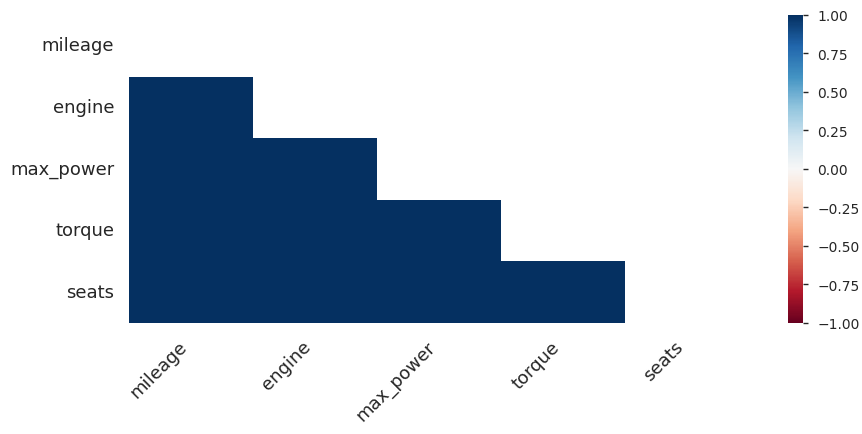

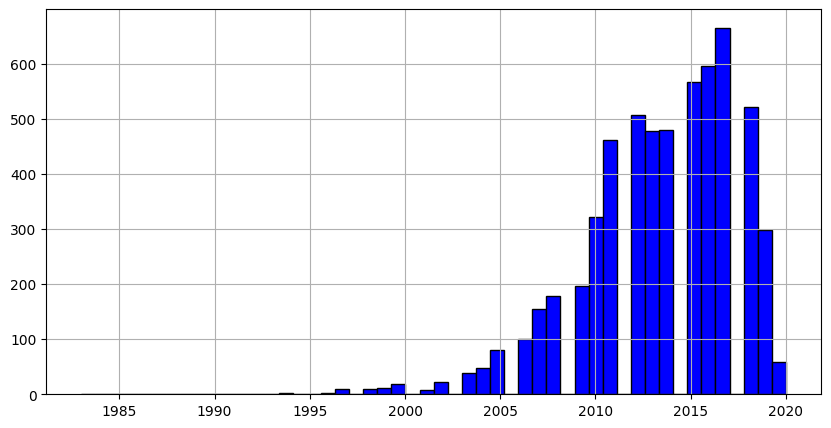

Histogram of selling_price


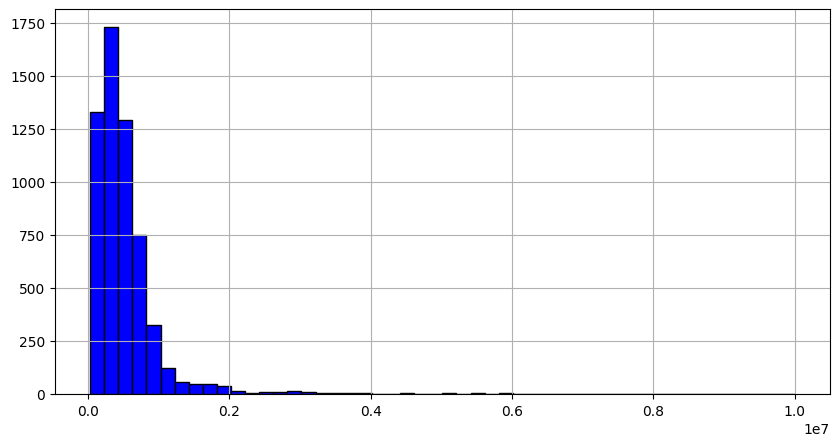

Histogram of km_driven


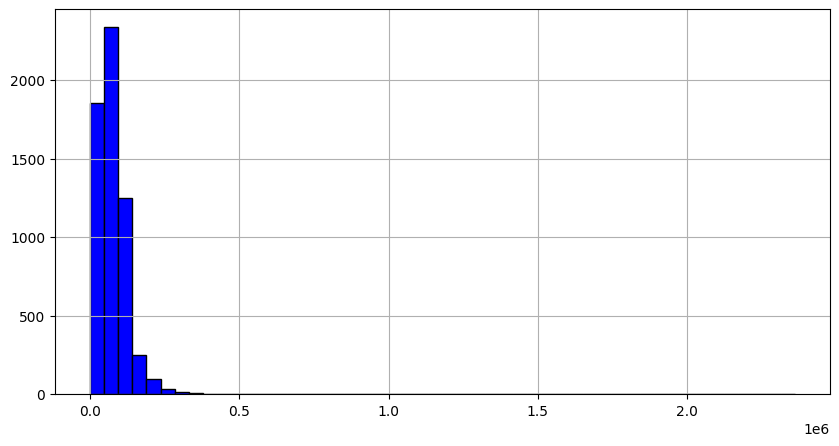

Histogram of seats


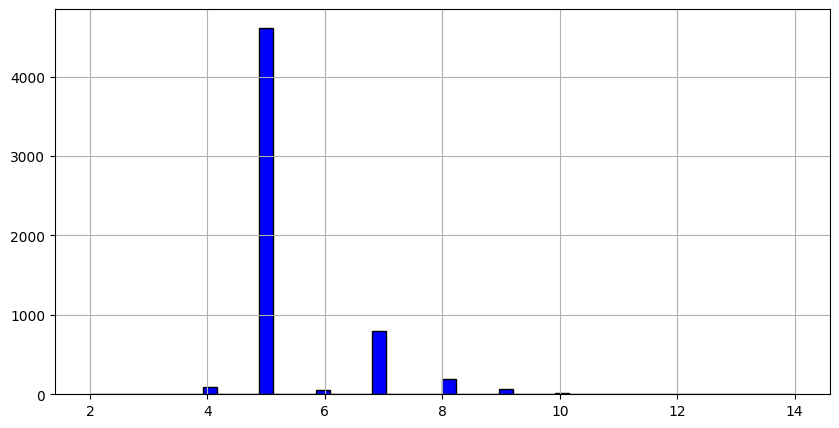

Histogram of torque_Nm


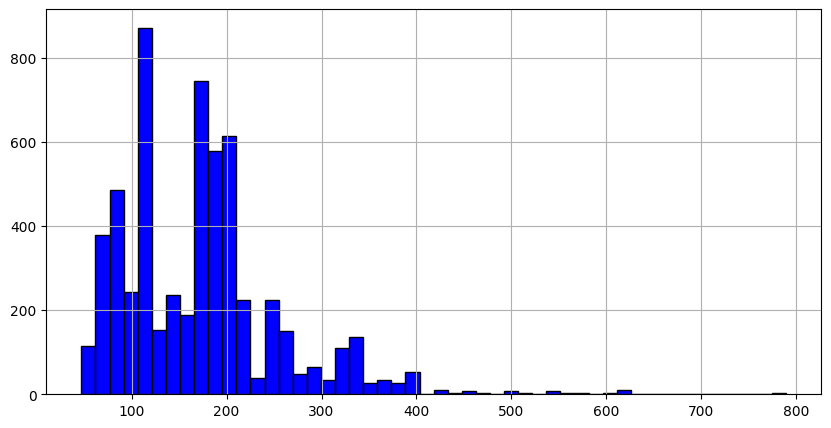

Histogram of torque_rpm


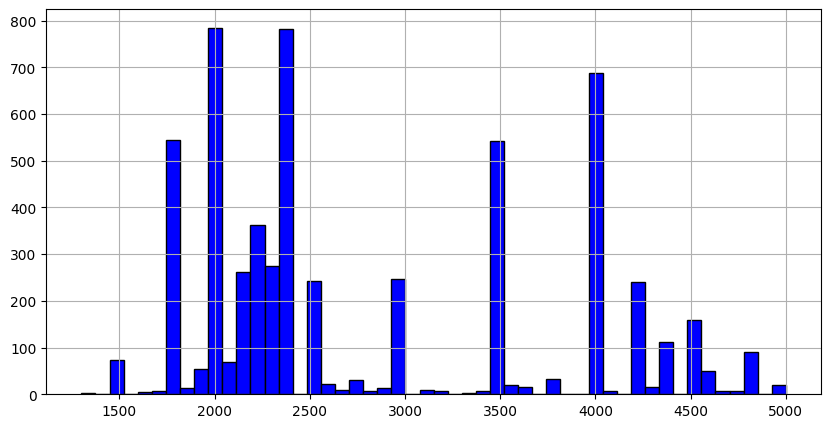

Histogram of mileage_kmpl


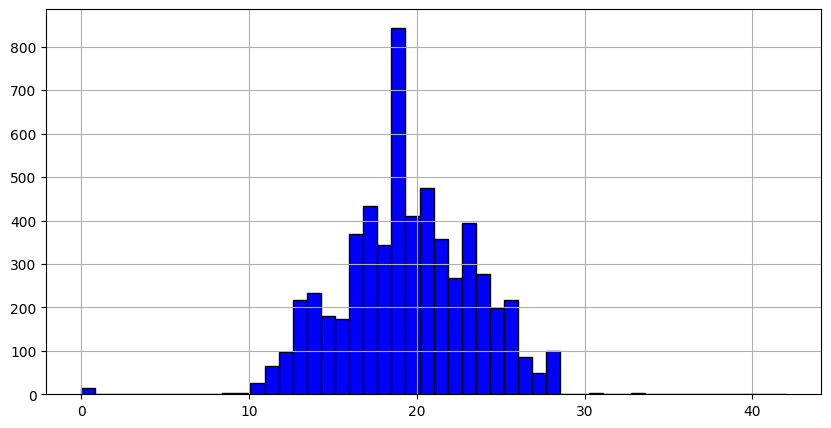

Histogram of engine_CC


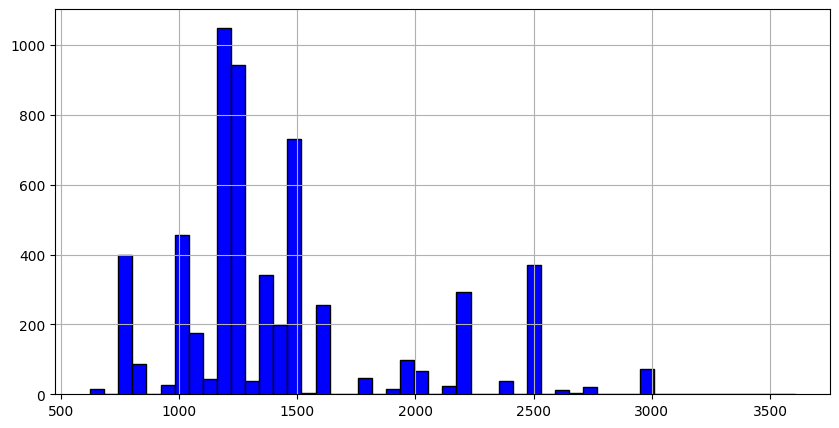

Histogram of max_power_bhp


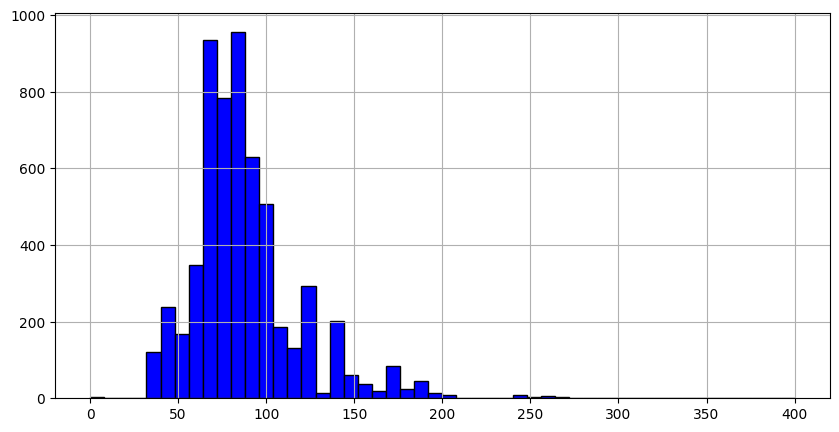

In [67]:
for col in num_cols:
  print(f'Histogram of {col}')
  plt.figure(figsize=(10,5))
  df_train_clean[col].hist(bins=50, color='blue', edgecolor='black')
  plt.show()

Распределения на тесте:

Histogram of year


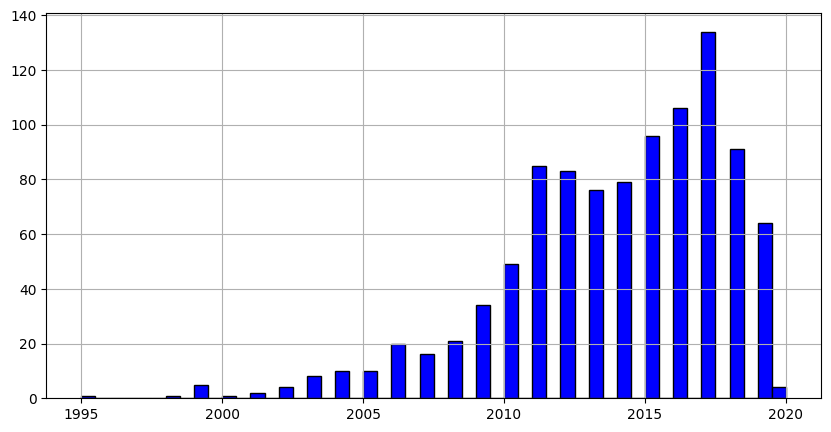

Histogram of selling_price


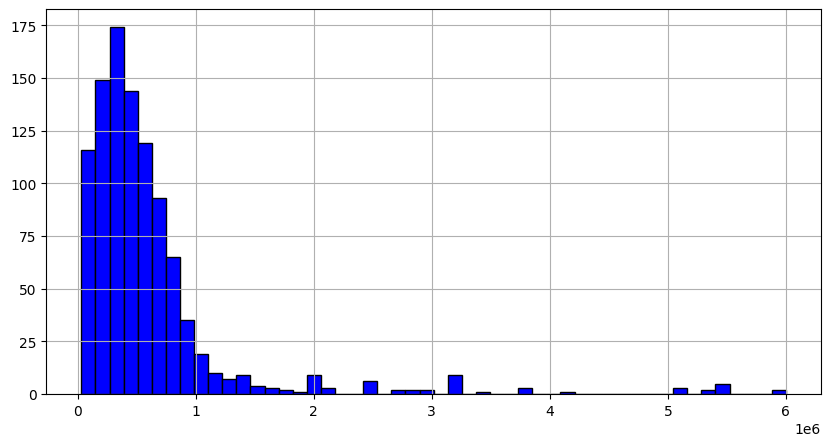

Histogram of km_driven


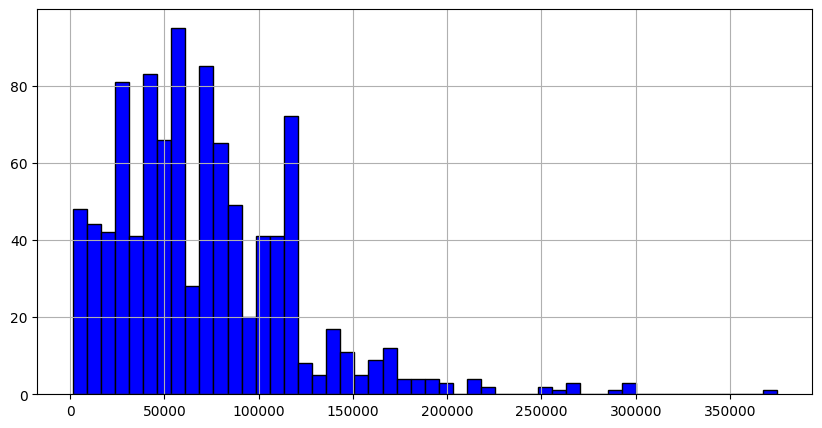

Histogram of seats


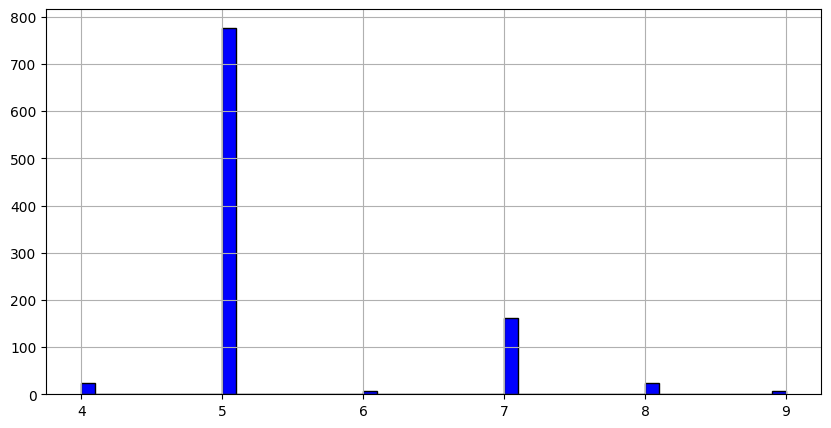

Histogram of torque_Nm


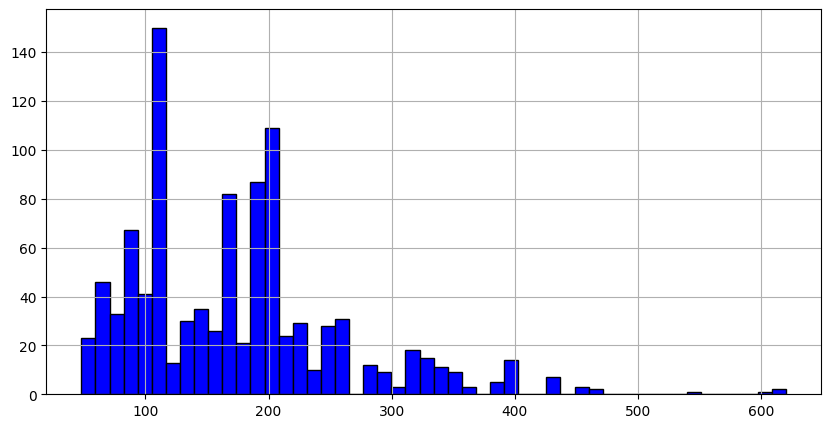

Histogram of torque_rpm


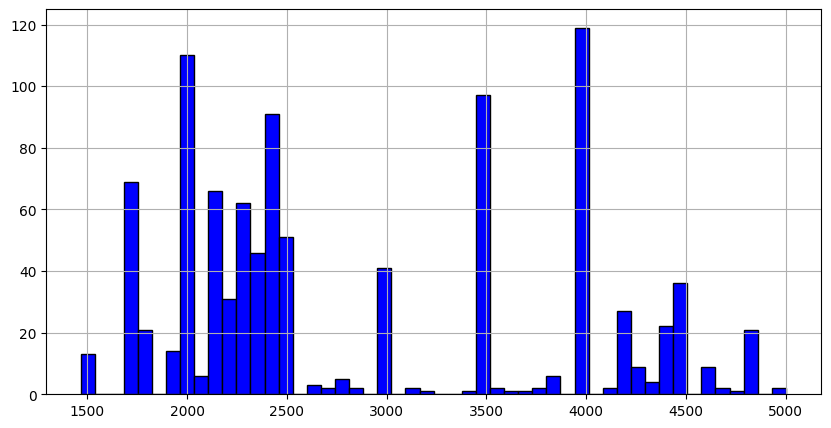

Histogram of mileage_kmpl


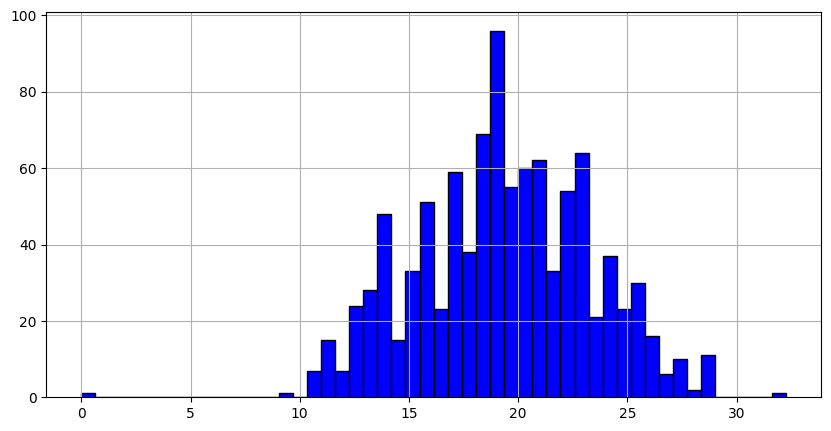

Histogram of engine_CC


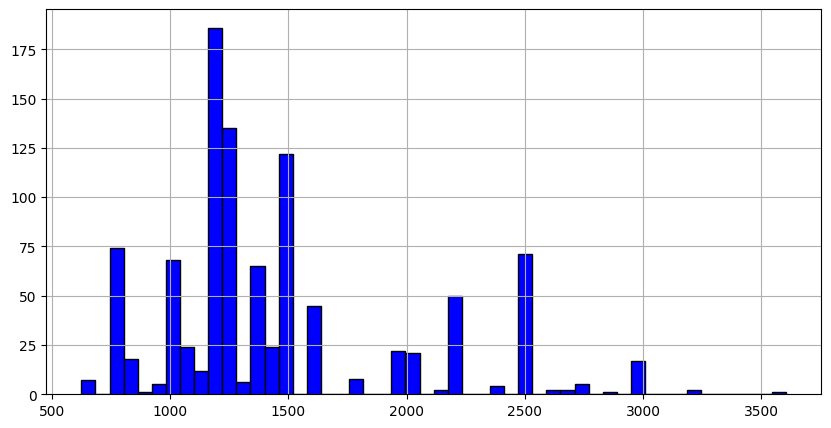

Histogram of max_power_bhp


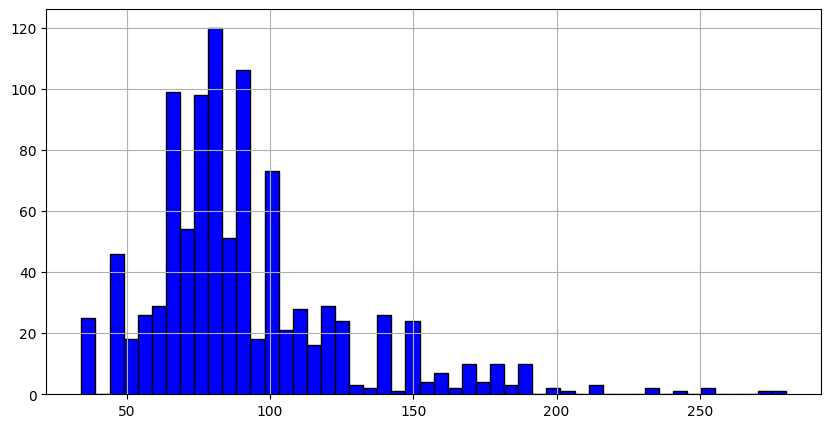

In [68]:
for col in num_cols:
  print(f'Histogram of {col}')
  plt.figure(figsize=(10,5))
  df_test[col].hist(bins=50, color='blue', edgecolor='black')
  plt.show()

In [69]:
df_train_clean_for_corr = df_train_clean[num_cols].copy()

In [70]:
correlation = df_train_clean_for_corr.corr()[target].sort_values(ascending=False)

In [71]:
print(correlation)

selling_price    1.000000
max_power_bhp    0.692754
torque_Nm        0.606899
engine_CC        0.447672
year             0.427279
seats            0.149953
mileage_kmpl    -0.104458
km_driven       -0.164828
torque_rpm      -0.167995
Name: selling_price, dtype: float64


Вывод: распределения данных на трейне и тесте совпадают. Свящь с целевой переменной довольно высокая у max_power_bhp, коэф. корреляции 0.69

### **Задание 6 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

In [72]:
# your code here

In [73]:
import seaborn as sns

Шаг 1

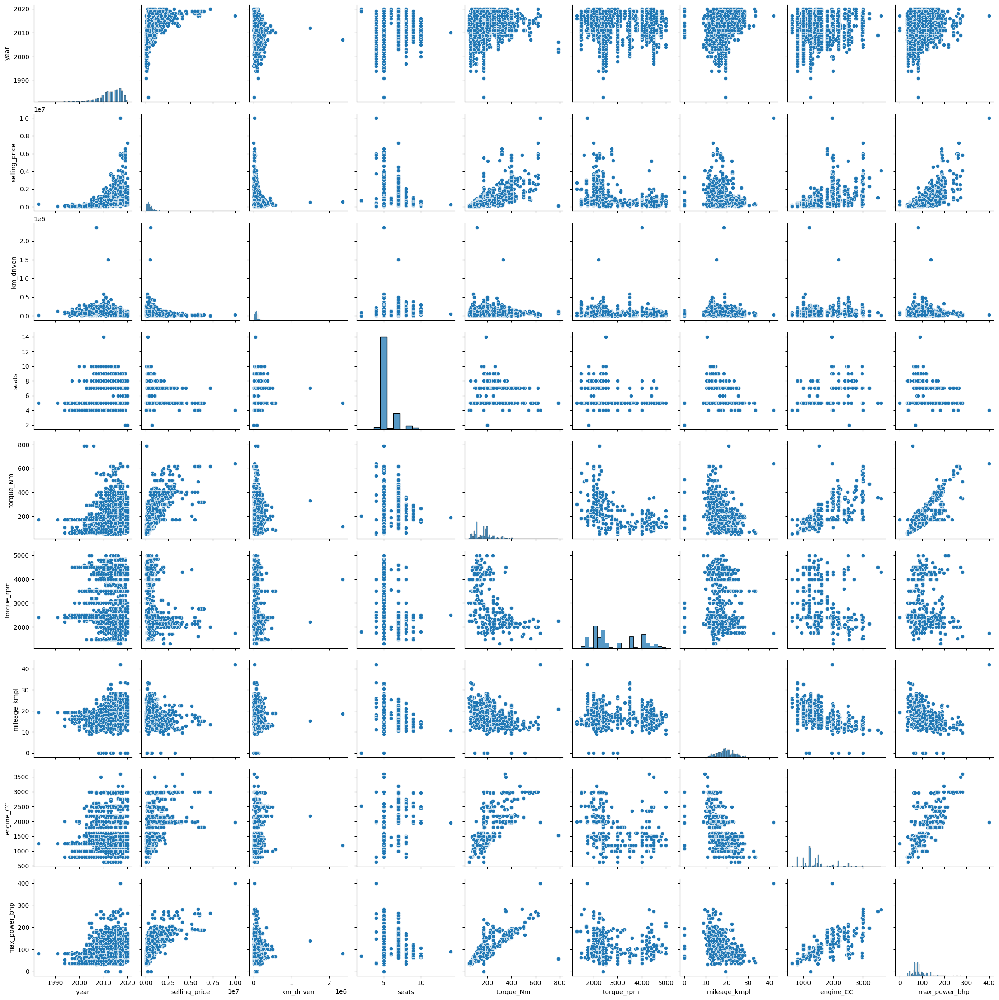

In [74]:
sns.pairplot(df_train_clean.select_dtypes(include='number'))

Шаг 2

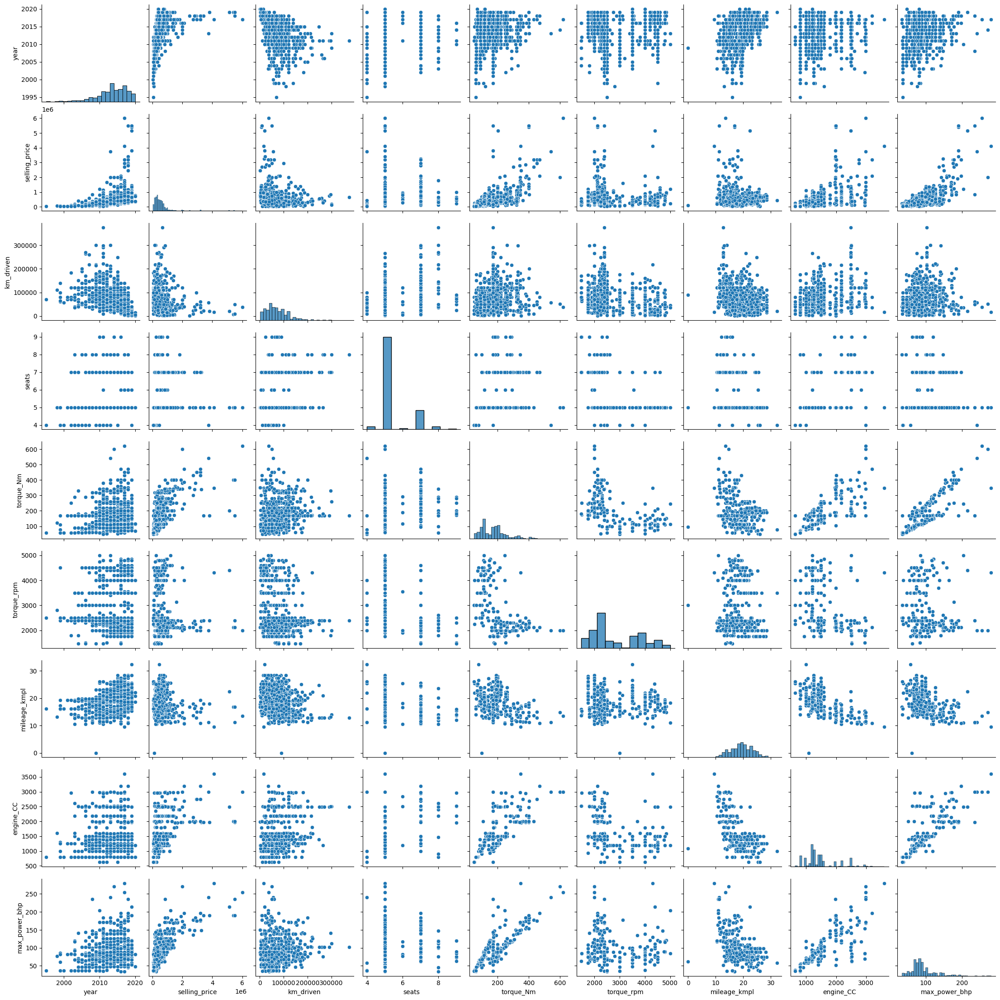

In [75]:
sns.pairplot(df_test.select_dtypes(include='number'))

In [76]:
# your code here

`Your answer here` 
1) На основе распределений видна связь некоторых признаков с целевой переменной.
2) На основе распределений можно выдвинуть гипотезу о корреляции max_power_bhp и torque_Nm с целевой переменной.
3) Cовокупности при разделении на трейн и тест оказались похожими.

### **Задание 7 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)


In [77]:
# your code here

In [78]:
corr_matrix = df_train_clean.select_dtypes(include='number').corr(method='pearson')
corr_matrix

,year,selling_price,km_driven,seats,torque_Nm,torque_rpm,mileage_kmpl,engine_CC,max_power_bhp
year,1.000000,0.427279,-0.368966,0.041178,0.114165,0.072900,0.342172,0.002819,0.156648
selling_price,0.427279,1.000000,-0.164828,0.149953,0.606899,-0.167995,-0.104458,0.447672,0.692754
km_driven,-0.368966,-0.164828,1.000000,0.192328,0.131823,-0.250036,-0.182245,0.229766,0.024630
seats,0.041178,0.149953,0.192328,1.000000,0.363471,-0.300513,-0.450810,0.652172,0.244060
torque_Nm,0.114165,0.606899,0.131823,0.363471,1.000000,-0.583380,-0.242709,0.725918,0.818278
torque_rpm,0.072900,-0.167995,-0.250036,-0.300513,-0.583380,1.000000,-0.070431,-0.399467,-0.164481
mileage_kmpl,0.342172,-0.104458,-0.182245,-0.450810,-0.242709,-0.070431,1.000000,-0.572677,-0.373271
engine_CC,0.002819,0.447672,0.229766,0.652172,0.725918,-0.399467,-0.572677,1.000000,0.681082
max_power_bhp,0.156648,0.692754,0.024630,0.244060,0.818278,-0.164481,-0.373271,0.681082,1.000000


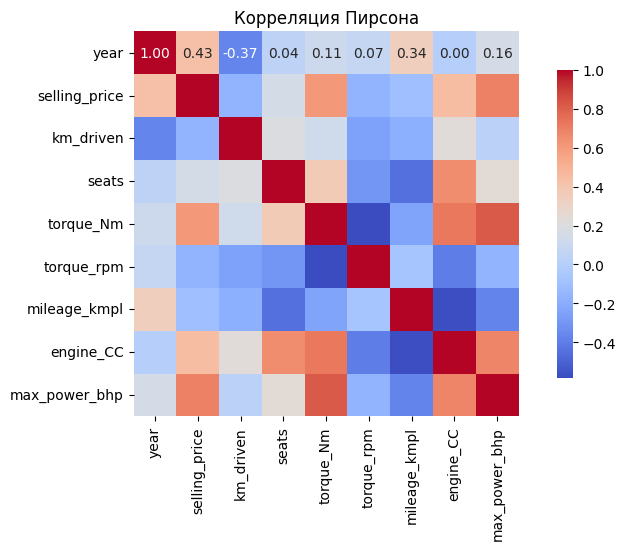

In [79]:
plt.figure(figsize=(10, 5))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, cbar_kws={"shrink": .8})
plt.title('Корреляция Пирсона')
plt.show()

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

`Your answer here`
1) Наименее скоррелированы между собой: year и engine_CC, коэф. корреляции Пирсона: 0.002819.
2) Довольно сильная положительная линейная зависимость между: torque_Nm	и max_power_bhp: 0.818278.
3) Да, такое утверждение возможно, тк. коэф. корреляции Пирсона отрицательный, хоть и не большой: -0.368966.

### **Бонус (0.5 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их **и поясните.**

In [80]:
# your code here

Отобразим выбросы из данных

In [81]:
def calculate_iqr_boundaries(series):
  q25 = series.quantile(0.25)
  q75 = series.quantile(0.75)
  iqr = q75 - q25

  boundaries = (q25 - 1.5 * iqr, q75 + 1.5 * iqr)
  return boundaries

boxplot of year


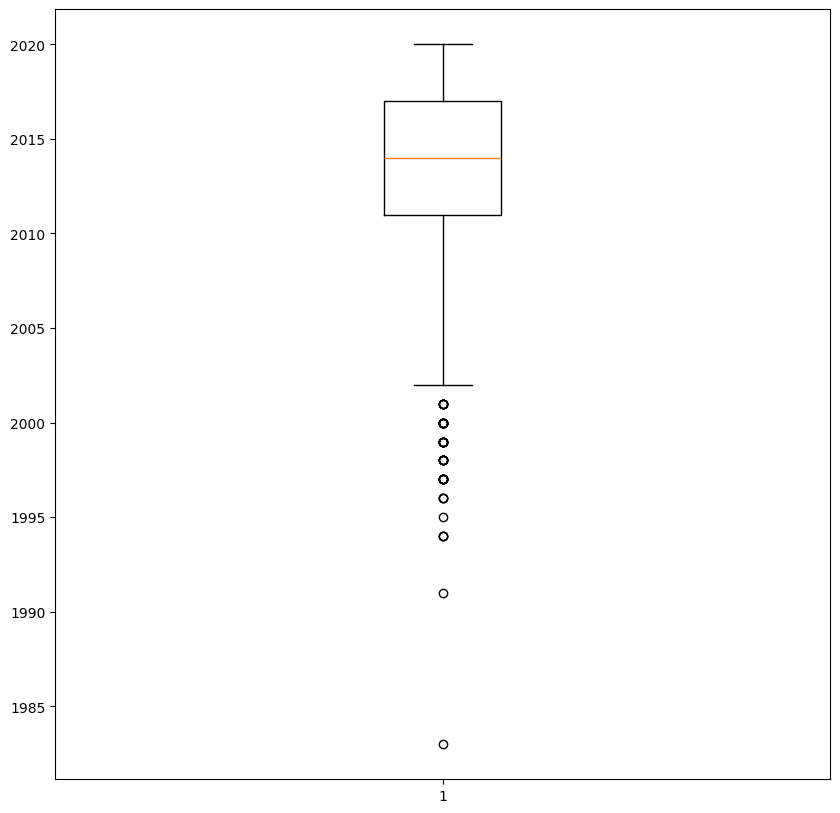

boxplot of selling_price


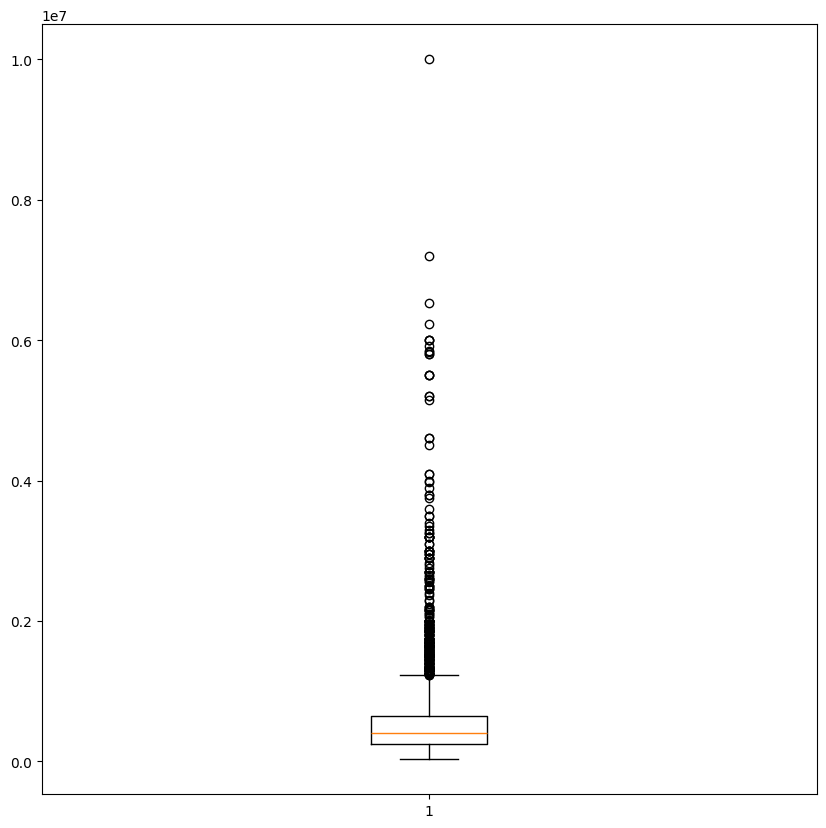

boxplot of km_driven


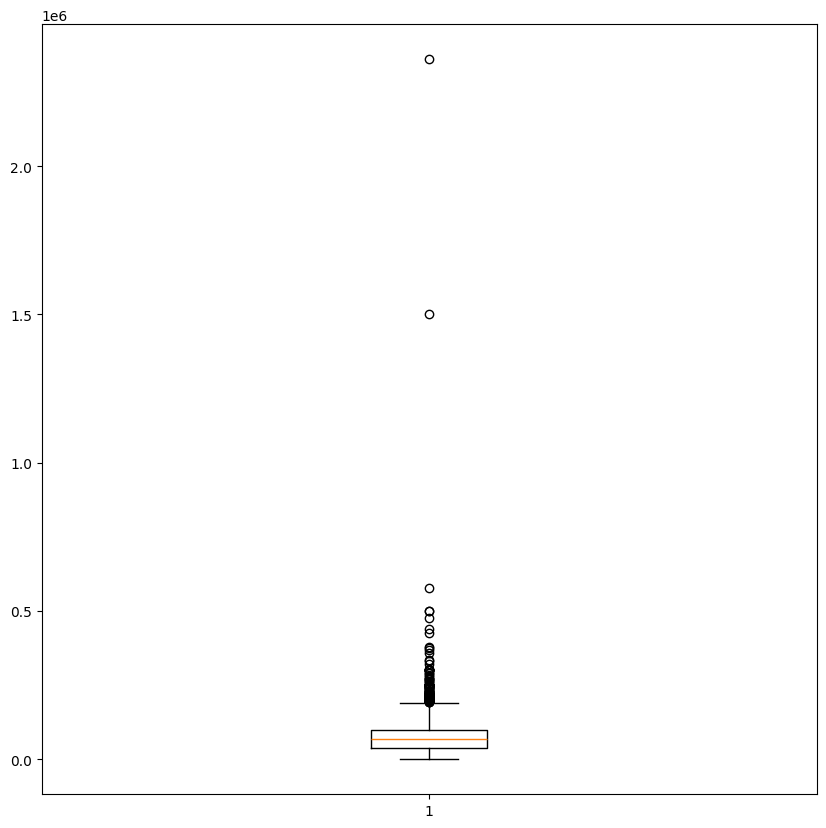

boxplot of seats


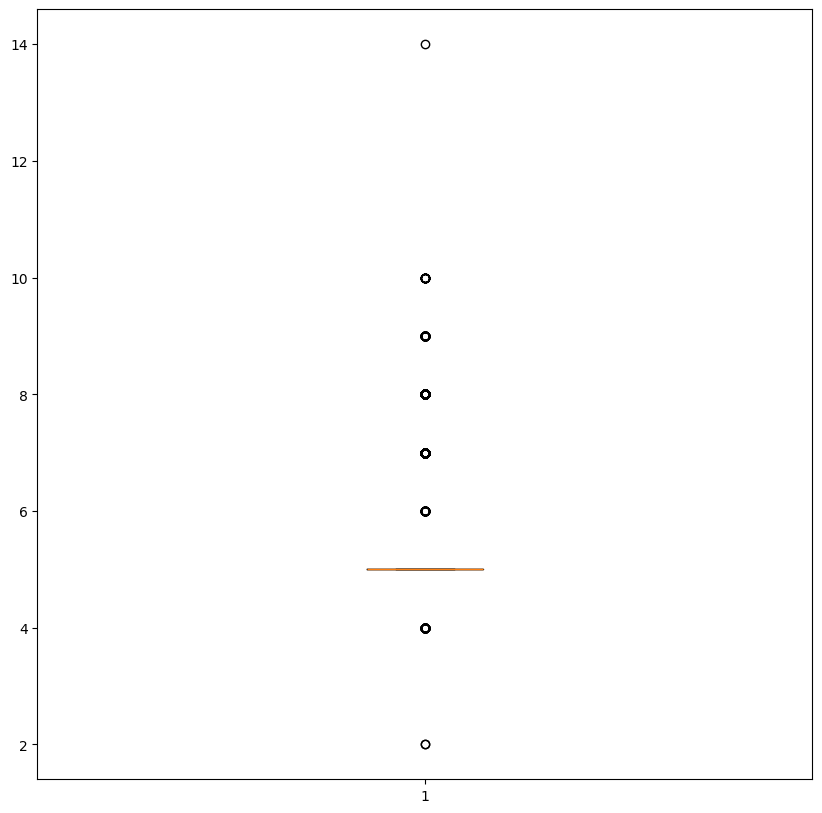

boxplot of torque_Nm


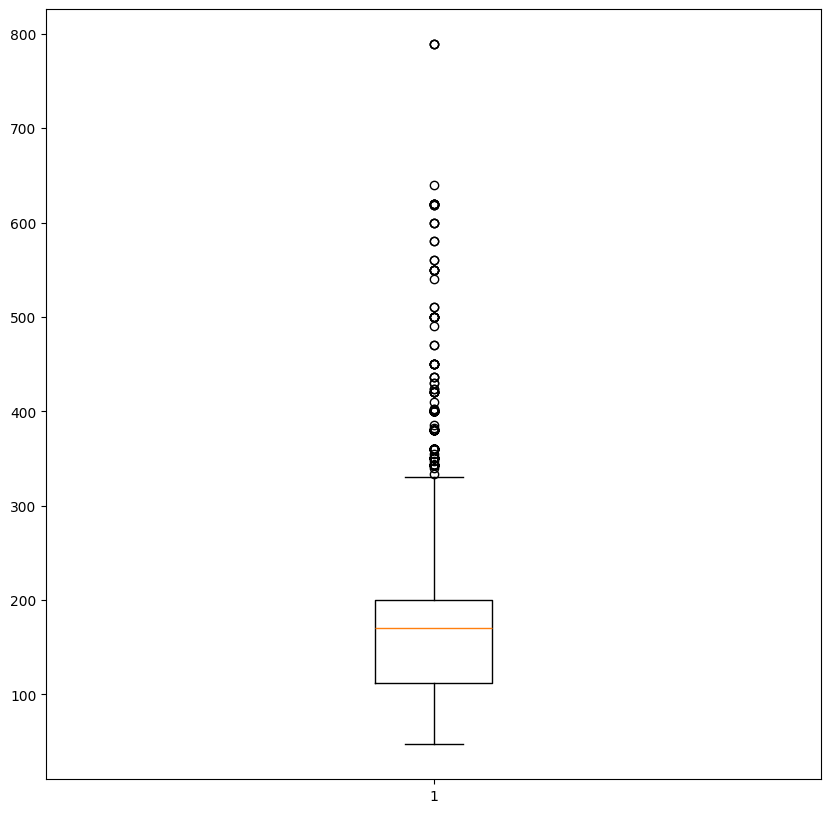

boxplot of torque_rpm


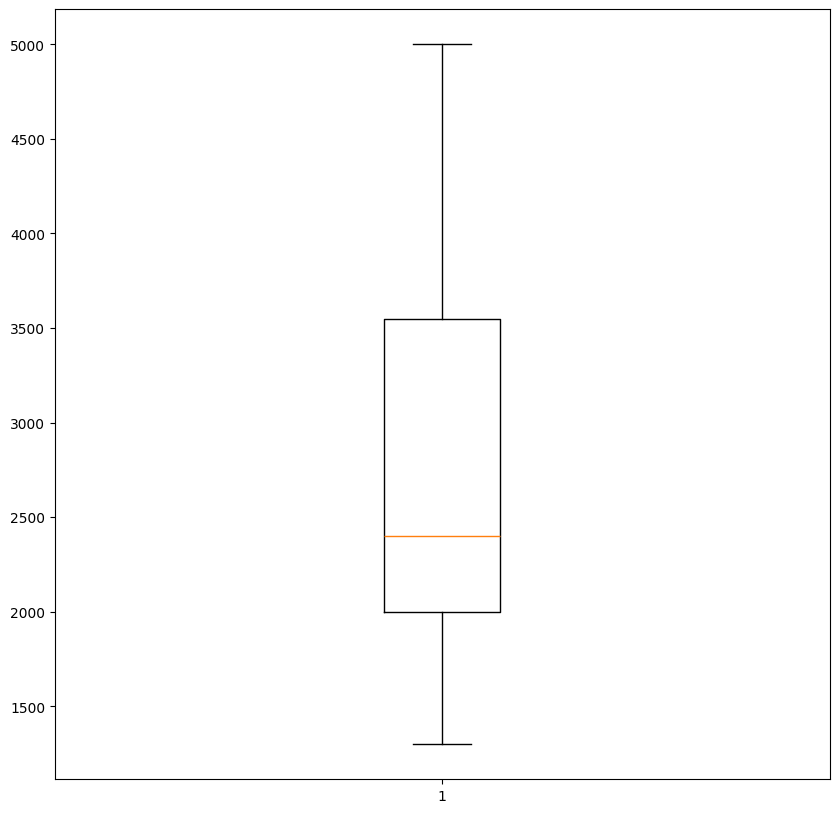

boxplot of mileage_kmpl


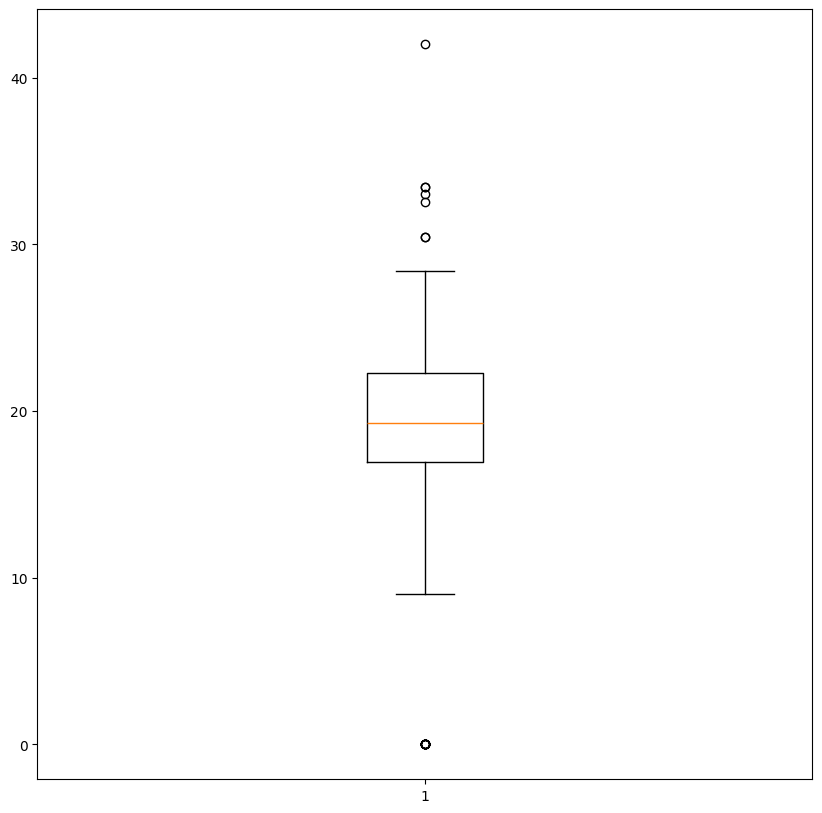

boxplot of engine_CC


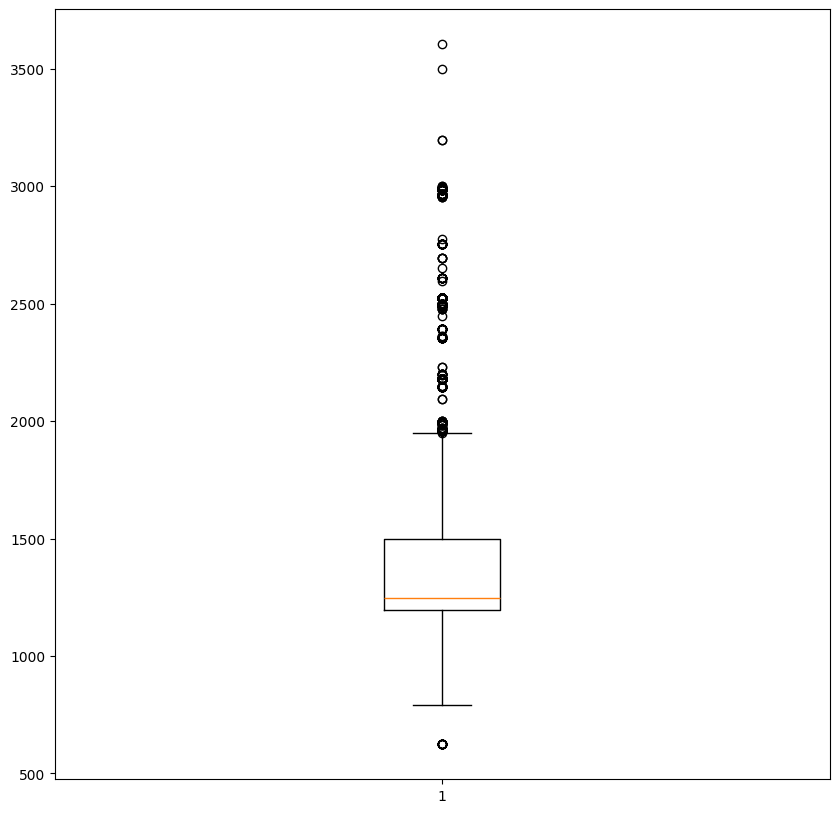

boxplot of max_power_bhp


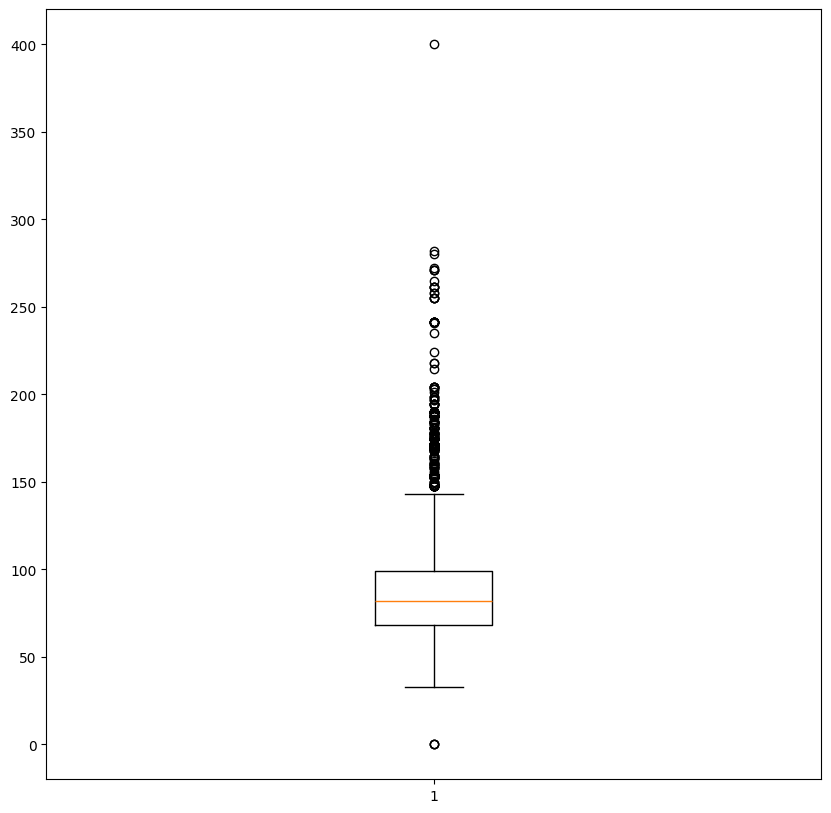

In [82]:
for col in num_cols:    
    plt.figure(figsize=(10,10))
    print(f'boxplot of {col}')
    plt.boxplot(df_train_clean[col])
    plt.show()

Посмотрим на возможной выброс из km_driven:

In [83]:
df_train_clean[df_train_clean['km_driven'] == df_train_clean['km_driven'].max()]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,seats,torque_Nm,torque_rpm,mileage_kmpl,engine_CC,max_power_bhp
2680,Hyundai i20 Asta 1.2,2007,550000,2360457,Petrol,Individual,Manual,Second Owner,5,114.7,4000.0,18.6,1197,81.83


В принципе с 2007 года реально проехать 2360457 км, поэтому не будем удалять эту строку

Посмотрим на возможной выброс из seats:

In [84]:
df_train_clean[df_train_clean['seats'] == df_train_clean['seats'].max()]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,seats,torque_Nm,torque_rpm,mileage_kmpl,engine_CC,max_power_bhp
3330,Tata Winger Deluxe - Flat Roof (Non-AC),2010,235000,50000,Diesel,Individual,Manual,First Owner,14,190.0,2500.0,10.71,1948,90.0


Это минми вен, поэтому количество сидящих мест 14 - реально.

In [85]:
df_train_clean[df_train_clean['seats'] == df_train_clean['seats'].min()]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,seats,torque_Nm,torque_rpm,mileage_kmpl,engine_CC,max_power_bhp
4305,Mahindra Bolero Pik-Up FB 1.7T,2020,679000,5000,Diesel,Individual,Manual,First Owner,2,200.0,1800.0,0.0,2523,70.0
4805,Mahindra Bolero Pik-Up CBC 1.7T,2019,722000,80000,Diesel,Individual,Manual,First Owner,2,200.0,1800.0,0.0,2523,70.0


Машины с 2 местами тоже есть

In [86]:
df_train_clean[df_train_clean['selling_price'] == df_train_clean['selling_price'].max()]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,seats,torque_Nm,torque_rpm,mileage_kmpl,engine_CC,max_power_bhp
151,Volvo XC90 T8 Excellence BSIV,2017,10000000,30000,Petrol,Individual,Automatic,First Owner,4,640.0,1740.0,42.0,1969,400.0


Для Volvo 2017 года - завышенная цена, но ее устанавливает владелец, поэтому вполне реальная ситуация.

Вывод: выбросов в данных нет.

# **Часть 2 | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.25 балла;

### **Задание 8 (0.05 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [87]:
df_train_num = df_train_clean.select_dtypes(include=['float64', 'int32', 'int64']).copy()

In [88]:
df_test_num = df_test.select_dtypes(include=['float64', 'int32', 'int64']).copy()

In [89]:
df_train_num.head()

,year,selling_price,km_driven,seats,torque_Nm,torque_rpm,mileage_kmpl,engine_CC,max_power_bhp
0,2014,450000,145500,5,190.00,2000.0,23.40,1248,74.00
1,2014,370000,120000,5,250.00,2000.0,21.14,1498,103.52
2,2010,225000,127000,5,219.52,2250.0,23.00,1396,90.00
3,2007,130000,120000,5,170.00,2400.0,16.10,1298,88.20
4,2017,440000,45000,5,113.75,4000.0,20.14,1197,81.86


In [90]:
df_test_num.head()

,year,selling_price,km_driven,seats,torque_Nm,torque_rpm,mileage_kmpl,engine_CC,max_power_bhp
0,2010,229999,168000,7,260.0,2000.0,14.0,2498,112.0
1,2017,665000,25000,5,260.0,2125.0,21.5,1497,108.5
2,2007,175000,218463,5,172.0,4300.0,12.9,1799,130.0
3,2015,635000,173000,5,200.0,1750.0,25.1,1498,98.6
4,2011,130000,70000,5,96.0,3000.0,16.5,1172,65.0


In [91]:
y_train = df_train_num[target]
X_train = df_train_num.drop([target], axis=1)

In [92]:
X_train.shape

(5840, 8)

In [ ]:
assert X_train.shape == (5840, 6)

Не совпадает, т.к. я разделил столбец torque на torque_Nm и torque_rpm

In [94]:
y_test = df_test_num[target]
X_test = df_test_num.drop([target], axis=1)

In [95]:
X_test.shape

(1000, 8)

In [ ]:
assert X_test.shape == (1000, 6)

Не совпадает, т.к. я разделил столбец torque на torque_Nm и torque_rpm

### **Задание 9 (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [97]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

# your code here

In [98]:
Lr = LinearRegression()

In [99]:
Lr.fit(X_train, y_train)

LinearRegression()

In [100]:
pred_Lr_train = Lr.predict(X_train)

In [101]:
pred_Lr_test = Lr.predict(X_test)

Значение метрик на трейне

In [102]:
print(f'r2_score: {round(r2_score(y_train, pred_Lr_train), 5)}')
print(f'MSE: {round(MSE(y_train, pred_Lr_train), 5)}')

r2_score: 0.60144
MSE: 114241835836.14056


Значение метрик на тесте

In [103]:
print(f'r2_score: {round(r2_score(y_test, pred_Lr_test), 5)}')
print(f'MSE: {round(MSE(y_test, pred_Lr_test), 5)}')

r2_score: 0.59709
MSE: 231605549214.55432


Вывод: точность модели - довольна плохая, ошибка высокая.

### **Задание 10 (0.15 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [104]:
from sklearn.preprocessing import StandardScaler

# your code here

In [105]:
scaler = StandardScaler()

In [106]:
X_train_2 = X_train.copy()
X_test_2 = X_test.copy()

In [107]:
X_train_sc = scaler.fit_transform(X_train_2)

In [108]:
X_train_scaled = pd.DataFrame(X_train_sc, columns=X_train_2.columns)
X_train_scaled.describe()

,year,km_driven,seats,torque_Nm,torque_rpm,mileage_kmpl,engine_CC,max_power_bhp
count,5.840000e+03,5.840000e+03,5.840000e+03,5.840000e+03,5.840000e+03,5.840000e+03,5.840000e+03,5.840000e+03
mean,2.328122e-14,-6.205082e-17,2.640202e-16,9.976799e-17,-9.490126e-17,1.484353e-16,-1.301851e-16,1.131515e-16
std,1.000086e+00,1.000086e+00,1.000086e+00,1.000086e+00,1.000086e+00,1.000086e+00,1.000086e+00,1.000086e+00
min,-7.430137e+00,-1.231167e+00,-3.488601e+00,-1.515270e+00,-1.640959e+00,-4.874598e+00,-1.658595e+00,-2.778744e+00
25%,-5.929826e-01,-5.818974e-01,-4.344190e-01,-7.276302e-01,-8.880375e-01,-6.218784e-01,-4.786631e-01,-6.293536e-01
50%,1.395696e-01,-6.579834e-02,-4.344190e-01,-2.438052e-02,-4.577967e-01,-3.226831e-02,-3.736430e-01,-1.912572e-01
75%,8.721218e-01,4.336523e-01,-4.344190e-01,3.393693e-01,7.791455e-01,7.204254e-01,1.411615e-01,3.505156e-01
max,1.604674e+00,3.806654e+01,8.728126e+00,7.480991e+00,2.338768e+00,5.663114e+00,4.477875e+00,9.864729e+00


In [109]:
X_test_sc= scaler.transform(X_test_2)
X_test_scaled = pd.DataFrame(X_test_sc, columns=X_test_2.columns)
X_test_scaled.describe()

,year,km_driven,seats,torque_Nm,torque_rpm,mileage_kmpl,engine_CC,max_power_bhp
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,0.061675,-0.042602,-0.024141,0.029660,0.049189,-0.022865,0.052360,0.092726
std,0.979703,0.807216,0.929409,1.048294,1.019050,0.991486,1.074903,1.102913
min,-4.499928,-1.209490,-1.452480,-1.503630,-1.458107,-4.874598,-1.658595,-1.697727
25%,-0.592983,-0.615194,-0.434419,-0.731025,-0.753587,-0.722238,-0.478663,-0.597745
50%,0.139570,-0.207309,-0.434419,-0.024381,-0.457797,-0.032268,-0.373643,-0.173398
75%,0.872122,0.433652,-0.434419,0.390901,1.263166,0.720425,0.314136,0.445342
max,1.604674,5.011950,3.637823,5.431867,2.338768,3.219369,4.477875,6.071687


In [110]:
Lr_scaled = LinearRegression()

In [111]:
Lr_scaled.fit(X_train_scaled, y_train)

LinearRegression()

In [112]:
pred_Lr_train_scaled = Lr_scaled.predict(X_train_scaled)
pred_Lr_test_scaled = Lr_scaled.predict(X_test_scaled)

Значение метрик на трейне

In [113]:
print(f'r2_score: {round(r2_score(y_train, pred_Lr_train_scaled), 5)}')
print(f'MSE: {round(MSE(y_train, pred_Lr_train_scaled), 5)}')

r2_score: 0.60144
MSE: 114241835836.14062


Значение метрик на тесте

In [114]:
print(f'r2_score: {round(r2_score(y_test, pred_Lr_test_scaled), 5)}')
print(f'MSE: {round(MSE(y_test, pred_Lr_test_scaled), 5)}')

r2_score: 0.59709
MSE: 231605549214.5575


Вывод: по видимой точности - модель не улучшилась

### **Задание 11 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [115]:
# your code here

In [116]:
coefficients_sc = Lr_scaled.coef_

In [117]:
importance_sc = pd.DataFrame({'Feature': X_test_2.columns, 'Coefficient': coefficients_sc})
importance_sc['Absolute Coefficient'] = importance_sc['Coefficient'].abs()
importance = importance_sc.sort_values(by='Absolute Coefficient', ascending=False)
print(importance)

         Feature    Coefficient  Absolute Coefficient
7  max_power_bhp  307564.924461         307564.924461
0           year  167408.664623         167408.664623
4     torque_rpm  -51501.979656          51501.979656
1      km_driven  -49781.165183          49781.165183
2          seats  -32303.152364          32303.152364
3      torque_Nm   29452.899010          29452.899010
6      engine_CC   14397.985620          14397.985620
5   mileage_kmpl  -10271.162025          10271.162025


Наиболее информативным оказался признак max_power_bhp 

### **Задание 12 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [118]:
from sklearn.linear_model import Lasso

# your code here

In [119]:
# your code here

In [120]:
random_seed = 42

In [121]:
lasso_regression = Lasso(random_state=random_seed)

In [122]:
lasso_regression.fit(X_train_scaled, y_train)

Lasso(random_state=42)

In [123]:
pred_lasso_regression_train = lasso_regression.predict(X_train_scaled)
pred_lasso_regression_test = lasso_regression.predict(X_test_scaled)

Значение метрик на трейне

In [124]:
print(f'r2_score: {round(r2_score(y_train, pred_lasso_regression_train), 5)}')
print(f'MSE: {round(MSE(y_train, pred_lasso_regression_train), 5)}')

r2_score: 0.60144
MSE: 114241835851.29411


Значение метрик на тесте

In [125]:
print(f'r2_score: {round(r2_score(y_test, pred_lasso_regression_test), 5)}')
print(f'MSE: {round(MSE(y_test, pred_lasso_regression_test), 5)}')

r2_score: 0.59709
MSE: 231606434687.9518


Проверка зануления весов:

Веса стандартной линейной модели

In [126]:
print('w_0:', Lr_scaled.intercept_)
print('w_i:', Lr_scaled.coef_)

w_0: 522960.0910958864
w_i: [167408.66462341 -49781.1651827  -32303.15236412  29452.89901001
 -51501.97965591 -10271.16202471  14397.98561991 307564.92446088]


Веса лассо регрессии

In [127]:
print('w_0:', lasso_regression.intercept_)
print('w_i:', lasso_regression.coef_)

w_0: 522960.0910958864
w_i: [167406.22487164 -49780.33647101 -32300.38458192  29458.48936345
 -51496.85672664 -10267.67823088  14397.97019046 307561.18979414]


Никакие веса не были занулены, т.к. значие коэффициентов этих признаков не лежит от 0 до лямбда, эти признаки важны для модели.

### **Задание 13 Финальный рывок (0.5 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [128]:
import numpy as np
from sklearn.model_selection import GridSearchCV
# your code here

In [129]:
# your code here

In [130]:
params_lasso_regression = {'alpha' : np.logspace(-4, 0, 50)}

gs_lasso_regression = GridSearchCV(lasso_regression, params_lasso_regression, cv=10, scoring= 'r2')

gs_lasso_regression.fit(X_train_scaled, y_train)

print('best score:', gs_lasso_regression.best_score_)
print('best params:', gs_lasso_regression.best_params_)

best score: 0.5736374109865331
best params: {'alpha': 1.0}


In [131]:
params_lasso_regression = {'alpha' : np.logspace(-4, 0, 50)}

gs_lasso_regression = GridSearchCV(lasso_regression, params_lasso_regression, cv=10, scoring= 'neg_mean_squared_error')

gs_lasso_regression.fit(X_train_scaled, y_train)

print('best score:', gs_lasso_regression.best_score_)
print('best params:', gs_lasso_regression.best_params_)

best score: -119640499864.49007
best params: {'alpha': 0.8286427728546842}


Примим alpha = 0.8286

In [132]:
count_models = len(gs_lasso_regression.cv_results_['params'])
print("Количество обученных моделей:", count_models)

Количество обученных моделей: 50


In [133]:
ls_reg_best = Lasso(random_state=random_seed, alpha=gs_lasso_regression.best_params_['alpha'])

In [134]:
ls_reg_best.fit(X_train_scaled, y_train)

Lasso(alpha=0.8286427728546842, random_state=42)

In [135]:
pred_ls_reg_train = ls_reg_best.predict(X_train_scaled)
pred_ls_reg_test = ls_reg_best.predict(X_test_scaled)

Значение метрик на трейне

In [136]:
print(f'r2_score: {round(r2_score(y_train, pred_ls_reg_train), 5)}')
print(f'MSE: {round(MSE(y_train, pred_ls_reg_train), 5)}')

r2_score: 0.60144
MSE: 114241835846.67065


Значение метрик на тесте

In [137]:
print(f'r2_score: {round(r2_score(y_test, pred_ls_reg_test), 5)}')
print(f'MSE: {round(MSE(y_test, pred_ls_reg_test), 5)}')

r2_score: 0.59709
MSE: 231606286524.42593


Веса лассо регрессии с лучшим параметром alpha

In [138]:
print('w_0:', ls_reg_best.intercept_)
print('w_i:', ls_reg_best.coef_)

w_0: 522960.0910958864
w_i: [167406.64007482 -49780.4824734  -32300.89649875  29457.66308843
 -51497.66544332 -10268.26948969  14398.03301395 307561.70426184]


Веса не занулились, у лучшей модели alpha = 0.8286

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [139]:
from sklearn.linear_model import ElasticNet

# your code here

In [140]:
El_Net = ElasticNet(random_state=random_seed)

In [141]:
params_El_Net = {'alpha' : np.logspace(-4, 0, 50),
                 'l1_ratio': np.linspace(0, 1, 10)}

gs_El_Net = GridSearchCV(El_Net, params_El_Net, cv=10, scoring= 'r2')

gs_El_Net.fit(X_train_scaled, y_train)

print('best score:', gs_El_Net.best_score_)
print('best params:', gs_El_Net.best_params_)

best score: 0.5819532954148973
best params: {'alpha': 0.2682695795279725, 'l1_ratio': 0.3333333333333333}


In [142]:
params_El_Net = {'alpha' : np.logspace(-4, 0, 50),
                 'l1_ratio': np.linspace(0, 1, 10)}

gs_El_Net_MSE = GridSearchCV(El_Net, params_El_Net, cv=10, scoring= 'neg_mean_squared_error')

gs_El_Net_MSE.fit(X_train_scaled, y_train)

print('best score:', gs_El_Net_MSE.best_score_)
print('best params:', gs_El_Net_MSE.best_params_)

best score: -119551728387.42522
best params: {'alpha': 0.023299518105153717, 'l1_ratio': 0.3333333333333333}


Примим alpha = 0.2683, l1_ratio = 0.3333333333333333

In [143]:
count_models_Net = len(gs_El_Net.cv_results_['params'])
print("Количество обученных моделей:", count_models_Net)

Количество обученных моделей: 500


In [144]:
El_Net_best = ElasticNet(random_state=random_seed, alpha=gs_El_Net.best_params_['alpha'], l1_ratio = gs_El_Net.best_params_['l1_ratio'])

In [145]:
El_Net_best.fit(X_train_scaled, y_train)

ElasticNet(alpha=0.2682695795279725, l1_ratio=0.3333333333333333,
           random_state=42)

In [146]:
pred_El_Net_train = El_Net_best.predict(X_train_scaled)
pred_El_Net_test = El_Net_best.predict(X_test_scaled)

Значение метрик на трейне

In [147]:
print(f'r2_score: {round(r2_score(y_train, pred_El_Net_train), 5)}')
print(f'MSE: {round(MSE(y_train, pred_El_Net_train), 5)}')

r2_score: 0.59138
MSE: 117126517250.81593


Значение метрик на тесте

In [148]:
print(f'r2_score: {round(r2_score(y_test, pred_El_Net_test), 5)}')
print(f'MSE: {round(MSE(y_test, pred_El_Net_test), 5)}')

r2_score: 0.55867
MSE: 253687980197.79205


Лучшие гиперпараметры: alpha=0.2683, l1_ratio=0.3333.

# **Часть 3| Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.75 основных балла и 0.25 бонусных.


### **Задание 14 (0.1 балла)** Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

В этом домашнем задании мы предлагаем удалить его.

**Ваша задача:**
- [ ] Удалить столбец`name`

In [149]:
# your code here

In [150]:
X_train_cat = df_train_clean.copy()
X_test_cat = df_test.copy()

In [151]:
X_train_cat.head(5)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,seats,torque_Nm,torque_rpm,mileage_kmpl,engine_CC,max_power_bhp
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,5,190.00,2000.0,23.40,1248,74.00
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,5,250.00,2000.0,21.14,1498,103.52
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,5,219.52,2250.0,23.00,1396,90.00
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,5,170.00,2400.0,16.10,1298,88.20
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,5,113.75,4000.0,20.14,1197,81.86


Из name можно вытащит ь марку автомобиля (проделаю это ниже в бонусе)

В другом случае, конечно, мы могли бы предобработать данный столбец. В качестве бонуса предлагаем вам придумать и реализовать алгоритм предобработки.

### **Бонус 0.5 балла**
- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

In [ ]:
assert X_train_cat.shape == (5840, 10)

In [153]:
X_train_cat['Car_Brand'] = X_train_cat['name'].apply(lambda x: x.split(' ')[0])

In [154]:
X_train_cat['Car_Brand'].value_counts()

Car_Brand
Maruti           1804
Hyundai          1058
Mahindra          611
Tata              534
Toyota            309
Ford              308
Honda             308
Chevrolet         188
Renault           171
Volkswagen        153
Nissan             63
Skoda              61
Datsun             49
Mercedes-Benz      44
BMW                41
Fiat               39
Audi               31
Jeep               20
Mitsubishi          8
Volvo               8
Jaguar              7
Force               4
Isuzu               4
Land                3
MG                  3
Daewoo              3
Kia                 3
Ambassador          3
Lexus               1
Peugeot             1
Name: count, dtype: int64

In [155]:
X_train_cat.drop(['name'], axis= 1, inplace= True)

In [156]:
X_train_cat.head()

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,seats,torque_Nm,torque_rpm,mileage_kmpl,engine_CC,max_power_bhp,Car_Brand
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,5,190.00,2000.0,23.40,1248,74.00,Maruti
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,5,250.00,2000.0,21.14,1498,103.52,Skoda
2,2010,225000,127000,Diesel,Individual,Manual,First Owner,5,219.52,2250.0,23.00,1396,90.00,Hyundai
3,2007,130000,120000,Petrol,Individual,Manual,First Owner,5,170.00,2400.0,16.10,1298,88.20,Maruti
4,2017,440000,45000,Petrol,Individual,Manual,First Owner,5,113.75,4000.0,20.14,1197,81.86,Hyundai


In [157]:
X_train_cat.describe(include='object')

,fuel,seller_type,transmission,owner,Car_Brand
count,5840,5840,5840,5840,5840
unique,4,3,2,5,30
top,Diesel,Individual,Manual,First Owner,Maruti
freq,3177,5223,5336,3603,1804


In [158]:
X_train_cat.shape

(5840, 14)

In [159]:
X_test_cat['Car_Brand'] = X_test_cat['name'].apply(lambda x: x.split(' ')[0])
X_test_cat.drop(['name'], axis= 1, inplace= True)

In [160]:
X_test_cat.head()

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,seats,torque_Nm,torque_rpm,mileage_kmpl,engine_CC,max_power_bhp,Car_Brand
0,2010,229999,168000,Diesel,Individual,Manual,First Owner,7,260.0,2000.0,14.0,2498,112.0,Mahindra
1,2017,665000,25000,Diesel,Individual,Manual,First Owner,5,260.0,2125.0,21.5,1497,108.5,Tata
2,2007,175000,218463,Petrol,Individual,Automatic,First Owner,5,172.0,4300.0,12.9,1799,130.0,Honda
3,2015,635000,173000,Diesel,Individual,Manual,First Owner,5,200.0,1750.0,25.1,1498,98.6,Honda
4,2011,130000,70000,Petrol,Individual,Manual,Second Owner,5,96.0,3000.0,16.5,1172,65.0,Tata


### **Задание 15 (0.4 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования. Обратите внимание, что во избежание мультиколлинеарности следует избавиться от одного из полученных столбцов при кодировании каждого признака методом OneHot.

Проведем сначала стандартизацию фичей:

In [161]:
scaler = StandardScaler()

In [162]:
columns_std = ['year', 'km_driven', 'torque_Nm', 'torque_rpm', 'mileage_kmpl',
       'engine_CC', 'max_power_bhp']

In [163]:
X_train_sc_2 = scaler.fit_transform(X_train_cat[columns_std])

In [164]:
variable = X_train_cat[columns_std].columns.map(lambda x: x + "_std")
X_train_cat[variable] = X_train_sc_2

In [165]:
X_train_cat.drop(columns_std, axis= 1, inplace= True)

In [166]:
X_train_cat.head()

,selling_price,fuel,seller_type,transmission,owner,seats,Car_Brand,year_std,km_driven_std,torque_Nm_std,torque_rpm_std,mileage_kmpl_std,engine_CC_std,max_power_bhp_std
0,450000,Diesel,Individual,Manual,First Owner,5,Maruti,0.139570,1.191152,0.218119,-0.888037,0.996413,-0.373643,-0.439701
1,370000,Diesel,Individual,Manual,Second Owner,5,Skoda,0.139570,0.766619,0.945619,-0.888037,0.429384,0.141162,0.493387
2,225000,Diesel,Individual,Manual,First Owner,5,Hyundai,-0.837167,0.883158,0.576049,-0.619137,0.896054,-0.068879,0.066037
3,130000,Petrol,Individual,Manual,First Owner,5,Maruti,-1.569719,0.766619,-0.024381,-0.457797,-0.835142,-0.270682,0.009142
4,440000,Petrol,Individual,Manual,First Owner,5,Hyundai,0.872122,-0.482007,-0.706411,1.263166,0.178486,-0.478663,-0.191257


In [167]:
X_test_sc_2 = scaler.transform(X_test_cat[columns_std])
X_test_cat[variable] = X_test_sc_2
X_test_cat.drop(columns_std, axis= 1, inplace= True)
X_test_cat.head()

,selling_price,fuel,seller_type,transmission,owner,seats,Car_Brand,year_std,km_driven_std,torque_Nm_std,torque_rpm_std,mileage_kmpl_std,engine_CC_std,max_power_bhp_std
0,229999,Diesel,Individual,Manual,First Owner,7,Mahindra,-0.837167,1.565740,1.066869,-0.888037,-1.362027,2.200379,0.761428
1,665000,Diesel,Individual,Manual,First Owner,5,Tata,0.872122,-0.814974,1.066869,-0.753587,0.519707,0.139102,0.650798
2,175000,Petrol,Individual,Automatic,First Owner,5,Honda,-1.569719,2.405866,-0.000131,1.585847,-1.638015,0.760986,1.330385
3,635000,Diesel,Individual,Manual,First Owner,5,Honda,0.383754,1.648982,0.339369,-1.156938,1.422940,0.141162,0.337872
4,130000,Petrol,Individual,Manual,Second Owner,5,Tata,-0.592983,-0.065798,-0.921630,0.187564,-0.734782,-0.530144,-0.724180


In [168]:
from sklearn.preprocessing import OneHotEncoder # или можно использовать get_dummies из библиотеки pandas

# your code here

In [169]:
ohe = OneHotEncoder(sparse_output=False, drop='first', handle_unknown='ignore')

ft_tr = ohe.fit_transform(X_train_cat[['seats', 'fuel', 'seller_type', 'transmission', 'owner', 'Car_Brand']])
X_train_cat[ohe.get_feature_names_out()] = ft_tr
X_train_cat.head()

,selling_price,fuel,seller_type,transmission,owner,seats,Car_Brand,year_std,km_driven_std,torque_Nm_std,...,Car_Brand_Mercedes-Benz,Car_Brand_Mitsubishi,Car_Brand_Nissan,Car_Brand_Peugeot,Car_Brand_Renault,Car_Brand_Skoda,Car_Brand_Tata,Car_Brand_Toyota,Car_Brand_Volkswagen,Car_Brand_Volvo
0,450000,Diesel,Individual,Manual,First Owner,5,Maruti,0.139570,1.191152,0.218119,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,370000,Diesel,Individual,Manual,Second Owner,5,Skoda,0.139570,0.766619,0.945619,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,225000,Diesel,Individual,Manual,First Owner,5,Hyundai,-0.837167,0.883158,0.576049,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,130000,Petrol,Individual,Manual,First Owner,5,Maruti,-1.569719,0.766619,-0.024381,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,440000,Petrol,Individual,Manual,First Owner,5,Hyundai,0.872122,-0.482007,-0.706411,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [170]:
X_train_cat.drop(['fuel', 'seller_type', 'transmission', 'owner', 'Car_Brand'], axis= 1, inplace= True)

In [171]:
X_train_cat.describe()

,selling_price,seats,year_std,km_driven_std,torque_Nm_std,torque_rpm_std,mileage_kmpl_std,engine_CC_std,max_power_bhp_std,seats_4,...,Car_Brand_Mercedes-Benz,Car_Brand_Mitsubishi,Car_Brand_Nissan,Car_Brand_Peugeot,Car_Brand_Renault,Car_Brand_Skoda,Car_Brand_Tata,Car_Brand_Toyota,Car_Brand_Volkswagen,Car_Brand_Volvo
count,5.840000e+03,5840.000000,5.840000e+03,5.840000e+03,5.840000e+03,5.840000e+03,5.840000e+03,5.840000e+03,5.840000e+03,5840.000000,...,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000
mean,5.229601e+05,5.426712,2.328122e-14,-6.205082e-17,9.976799e-17,-9.490126e-17,1.484353e-16,-1.301851e-16,1.131515e-16,0.016096,...,0.007534,0.001370,0.010788,0.000171,0.029281,0.010445,0.091438,0.052911,0.026199,0.001370
std,5.354320e+05,0.982344,1.000086e+00,1.000086e+00,1.000086e+00,1.000086e+00,1.000086e+00,1.000086e+00,1.000086e+00,0.125855,...,0.086480,0.036989,0.103311,0.013086,0.168607,0.101675,0.288256,0.223875,0.159739,0.036989
min,2.999900e+04,2.000000,-7.430137e+00,-1.231167e+00,-1.515270e+00,-1.640959e+00,-4.874598e+00,-1.658595e+00,-2.778744e+00,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.500000e+05,5.000000,-5.929826e-01,-5.818974e-01,-7.276302e-01,-8.880375e-01,-6.218784e-01,-4.786631e-01,-6.293536e-01,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,4.050000e+05,5.000000,1.395696e-01,-6.579834e-02,-2.438052e-02,-4.577967e-01,-3.226831e-02,-3.736430e-01,-1.912572e-01,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,6.400000e+05,5.000000,8.721218e-01,4.336523e-01,3.393693e-01,7.791455e-01,7.204254e-01,1.411615e-01,3.505156e-01,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000e+07,14.000000,1.604674e+00,3.806654e+01,7.480991e+00,2.338768e+00,5.663114e+00,4.477875e+00,9.864729e+00,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [172]:
ft_test = ohe.transform(X_test_cat[['seats', 'fuel', 'seller_type', 'transmission', 'owner', 'Car_Brand']])
X_test_cat[ohe.get_feature_names_out()] = ft_test
X_test_cat.drop(['fuel', 'seller_type', 'transmission', 'owner', 'Car_Brand'], axis= 1, inplace= True)
X_test_cat.head()

,selling_price,seats,year_std,km_driven_std,torque_Nm_std,torque_rpm_std,mileage_kmpl_std,engine_CC_std,max_power_bhp_std,seats_4,...,Car_Brand_Mercedes-Benz,Car_Brand_Mitsubishi,Car_Brand_Nissan,Car_Brand_Peugeot,Car_Brand_Renault,Car_Brand_Skoda,Car_Brand_Tata,Car_Brand_Toyota,Car_Brand_Volkswagen,Car_Brand_Volvo
0,229999,7,-0.837167,1.565740,1.066869,-0.888037,-1.362027,2.200379,0.761428,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,665000,5,0.872122,-0.814974,1.066869,-0.753587,0.519707,0.139102,0.650798,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,175000,5,-1.569719,2.405866,-0.000131,1.585847,-1.638015,0.760986,1.330385,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,635000,5,0.383754,1.648982,0.339369,-1.156938,1.422940,0.141162,0.337872,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,130000,5,-0.592983,-0.065798,-0.921630,0.187564,-0.734782,-0.530144,-0.724180,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [173]:
X_test_cat.describe()

,selling_price,seats,year_std,km_driven_std,torque_Nm_std,torque_rpm_std,mileage_kmpl_std,engine_CC_std,max_power_bhp_std,seats_4,...,Car_Brand_Mercedes-Benz,Car_Brand_Mitsubishi,Car_Brand_Nissan,Car_Brand_Peugeot,Car_Brand_Renault,Car_Brand_Skoda,Car_Brand_Tata,Car_Brand_Toyota,Car_Brand_Volkswagen,Car_Brand_Volvo
count,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,...,1000.000000,1000.000000,1000.000000,1000.0,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,6.179010e+05,5.403000,0.061675,-0.042602,0.029660,0.049189,-0.022865,0.052360,0.092726,0.024000,...,0.005000,0.004000,0.011000,0.0,0.02900,0.013000,0.106000,0.059000,0.015000,0.010000
std,7.585539e+05,0.912921,0.979703,0.807216,1.048294,1.019050,0.991486,1.074903,1.102913,0.153126,...,0.070569,0.063151,0.104355,0.0,0.16789,0.113331,0.307992,0.235743,0.121613,0.099549
min,3.100000e+04,4.000000,-4.499928,-1.209490,-1.503630,-1.458107,-4.874598,-1.658595,-1.697727,0.000000,...,0.000000,0.000000,0.000000,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.500000e+05,5.000000,-0.592983,-0.615194,-0.731025,-0.753587,-0.722238,-0.478663,-0.597745,0.000000,...,0.000000,0.000000,0.000000,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,4.349990e+05,5.000000,0.139570,-0.207309,-0.024381,-0.457797,-0.032268,-0.373643,-0.173398,0.000000,...,0.000000,0.000000,0.000000,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,6.700000e+05,5.000000,0.872122,0.433652,0.390901,1.263166,0.720425,0.314136,0.445342,0.000000,...,0.000000,0.000000,0.000000,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
max,6.000000e+06,9.000000,1.604674,5.011950,5.431867,2.338768,3.219369,4.477875,6.071687,1.000000,...,1.000000,1.000000,1.000000,0.0,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000


### **Задание 16 (0.25 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [174]:
y_train = X_train_cat['selling_price']
X_train_cat = X_train_cat.drop(['selling_price'], axis=1)

In [175]:
y_test = X_test_cat['selling_price']
X_test_cat = X_test_cat.drop(['selling_price'], axis=1)

In [176]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

# your code here

In [177]:
rige_regression = Ridge(random_state=random_seed)

In [178]:
params_rige_regression = {'alpha' : np.logspace(-4, 0, 50)}

gs_rige_regression = GridSearchCV(rige_regression, params_rige_regression, cv=10, scoring= 'r2')

gs_rige_regression.fit(X_train_cat, y_train)

print('best score:', gs_rige_regression.best_score_)
print('best params:', gs_rige_regression.best_params_)

best score: 0.7147064041316251
best params: {'alpha': 1.0}


In [179]:
rige_regression_best = Ridge(random_state=random_seed, alpha=gs_rige_regression.best_params_['alpha'])

In [180]:
rige_regression_best.fit(X_train_cat, y_train)

Ridge(random_state=42)

In [181]:
pred_rige_regression_train = rige_regression_best.predict(X_train_cat)
pred_rige_regression_test = rige_regression_best.predict(X_test_cat)

Значение метрик на трейне

In [182]:
print(f'r2_score: {round(r2_score(y_train, pred_rige_regression_train), 5)}')
print(f'MSE: {round(MSE(y_train, pred_rige_regression_train), 5)}')

r2_score: 0.77573
MSE: 64285518128.86485


Значение метрик на тесте

In [183]:
print(f'r2_score: {round(r2_score(y_test, pred_rige_regression_test), 5)}')
print(f'MSE: {round(MSE(y_test, pred_rige_regression_test), 5)}')

r2_score: 0.78347
MSE: 124467545072.89255


Удалось улучшить качество прогнозов (r2_score вырос с 0.59138 до 0.78348)

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 17 (0.5 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [184]:
def business_metric(y_true, y_pred):
    counter = 0
    for elem in range(len(y_pred)):
        if 0.9 <= y_pred[elem]/y_true[elem] <= 1.1:
            counter +=1
    metric = round(counter/len(y_pred)*100)
    return print(f'Доля нужных прогнозов: {metric}%')

In [185]:
y_test_true = y_test.copy()
y_test_pred = X_test_cat.copy()

1) Линейная регрессия на обдычных вещественных признаках:

In [186]:
y_test_pred['predictions_lr'] = pred_Lr_test

In [187]:
business_metric(y_test, y_test_pred['predictions_lr'])

Доля нужных прогнозов: 24%


2) Линейная регрессия на стандартизированных вещественных признаках:

In [188]:
y_test_pred['predictions_lr_sc'] = pred_Lr_test_scaled

In [189]:
business_metric(y_test, y_test_pred['predictions_lr_sc'])

Доля нужных прогнозов: 24%


3) Lasso регрессия на стандартизированных вещественных признаках:

In [190]:
y_test_pred['predictions_Lasso_sc'] = pred_lasso_regression_test

In [191]:
business_metric(y_test, y_test_pred['predictions_Lasso_sc'])

Доля нужных прогнозов: 24%


4) Lasso регрессия на стандартизированных вещественных признаках после подбора гиперпараметров:

In [192]:
y_test_pred['predictions_Lasso_sc_b'] = pred_ls_reg_test

In [193]:
business_metric(y_test, y_test_pred['predictions_Lasso_sc_b'])

Доля нужных прогнозов: 24%


5) ElasticNet регрессия на стандартизированных вещественных признаках после подбора гиперпараметров:

In [194]:
y_test_pred['predictions_El_Net_sc_b'] = pred_El_Net_test

In [195]:
business_metric(y_test, y_test_pred['predictions_El_Net_sc_b'])

Доля нужных прогнозов: 26%


6) Ridge регрессия на стандартизированных вещественных и признаках после подбора гиперпараметров:

In [196]:
y_test_pred['predictions_rige_sc_cat_b'] = pred_rige_regression_test

In [197]:
business_metric(y_test, y_test_pred['predictions_rige_sc_cat_b'])

Доля нужных прогнозов: 30%


`Your answer here`

Ответ: Лучше всего (из предложенных моделей) решает задачу бизнеса Ridge регрессия. У нее доля нужных прогнозов: 30%

Сохраним веса модели в pickle файл

In [198]:
import dill
import datetime

In [199]:
best_score = r2_score(y_test, pred_rige_regression_test)

In [200]:
model_filename = f'price_cars.pkl'
with open (model_filename, 'wb') as file:
    dill.dump({
        'model': rige_regression_best,
        'metadata': {
            'name': 'Price prediction model',
            'author': 'Denis Kruglov',
            'version': 1,
            'date': datetime.datetime.now(),
            'accuracy': best_score
        }
    }, file)

# **Часть 5 (3 балла) | Реализация сервиса на FastAPI**

### **Задание 18 (3 балла)**


Cделайте с помощью FastAPI сервис, который с точки зрения пользователя реализует две функции:

1. на вход в формате json подаются признаки одного объекта, на выходе сервис выдает предсказанную стоимость машины
2. на вход подается csv-файл с признаками тестовых объектов, на выходе получаем файл с +1 столбцом - предсказаниями на этих объектах

С точки зрения реализации это означает следующее:
- средствами pydantic должен быть описан класс базового объекта
- класс с коллецией объектов
- метод post, который получает на вход один объект описанного класса
- метод post, который получает на вход коллекцию объектов описанного класса

Шаблон для сервисной части дан ниже. Код необходимо дополнить и оформить в виде отдельного .py-файла.

In [404]:
from fastapi import FastAPI
from pydantic import BaseModel
from typing import List

app = FastAPI()


class Item(BaseModel):
    name: str
    year: int
    selling_price: int
    km_driven: int
    fuel: str
    seller_type: str
    transmission: str
    owner: str
    mileage: str
    engine: str
    max_power: str
    torque: str
    seats: float


class Items(BaseModel):
    objects: List[Item]


@app.post("/predict_item")
def predict_item(item: Item) -> float:
    return ...


@app.post("/predict_items")
def predict_items(items: List[Item]) -> List[float]:
    return ...

ModuleNotFoundError: No module named 'fastapi'

Протестируйте сервис на корректность работы и приложите скриншоты (см. ниже).

# **Часть 6 (1 балл) | Оформление результатов**

### **Задание 19 (1 балл)**


**Результаты вашей работы** необходимо разместить в своем Гитхабе. Под результатами понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* сохраненный дашборд в любом формате
* ``.py``-файл с реализацией сервиса
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)

**Как будет выглядет проверка всего домашнего задания?**
1. Ассистент проходит по ссылке на (**открытый**) репозиторий из Энитаска
2. Смотрит ``readme.md``:
    * пожалуйста, приложите в него же скрины работы вашего сервиса -- собирать ваши проекты довольно времязатратно, но хочется убедиться, что всё работает
    * можете в md-файл приложить ссылку на screencast с демонстрацией
3. Просматривает ноутбук с DS-частью
4. Заглядывает в код сервиса
5. Хвалит

# **Часть Благодарственная**

Надеемся, вы честно проделали все пункты, а не просто пролистали досюда. Потому что здесь награда за старания. Пожалуйста, не стоит награждать себя до того, как закончите работать над домашкой!

<details>
<summary><b>Что-то приятное</b></summary>

**Напоминаем, что нашем курсе действует система кото-бонусов** 🐈

На фото по ссылке — сэр кот кого-то из команды курса (преподаватель, помощник преподавателя, ассистенты).

Предлагаем вам угадать — чей это товарищ!

[Первый кот](https://ibb.co/XbnpCTg)

</details>

